In [1]:
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/pneumonia-detection-using-cnn-92-6-accuracy/__results__.html
/kaggle/input/pneumonia-detection-using-cnn-92-6-accuracy/__resultx__.html
/kaggle/input/pneumonia-detection-using-cnn-92-6-accuracy/__notebook__.ipynb
/kaggle/input/pneumonia-detection-using-cnn-92-6-accuracy/__output__.json
/kaggle/input/pneumonia-detection-using-cnn-92-6-accuracy/custom.css
/kaggle/input/pneumonia-detection-using-cnn-92-6-accuracy/__results___files/__results___31_1.png
/kaggle/input/pneumonia-detection-using-cnn-92-6-accuracy/__results___files/__results___9_1.png
/kaggle/input/pneumonia-detection-using-cnn-92-6-accuracy/__results___files/__results___36_0.png
/kaggle/input/pneumonia-detection-using-cnn-92-6-accuracy/__results___files/__results___12_1.png
/kaggle/input/pneumonia-detection-using-cnn-92-6-accuracy/__results___files/__results___34_0.png
/kaggle/input/pneumonia-detection-using-cnn-92-6-accuracy/__results___files/__results___26_0.png
/kaggle/input/pneumonia-detection-using-cnn-92-6-

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import keras
from keras.models import Sequential
from keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout , BatchNormalization
# from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from keras.callbacks import ReduceLROnPlateau
import cv2
import os

2024-04-21 08:35:53.359853: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-21 08:35:53.359940: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-21 08:35:53.490691: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


RGB
(512, 512)


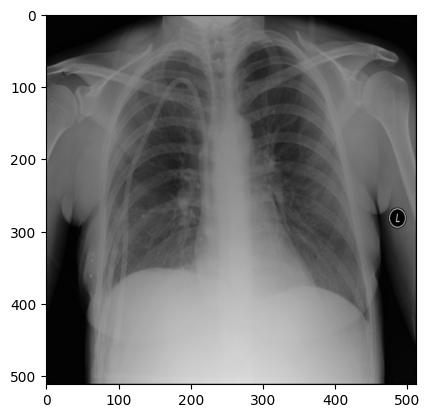

RGB
(512, 512)


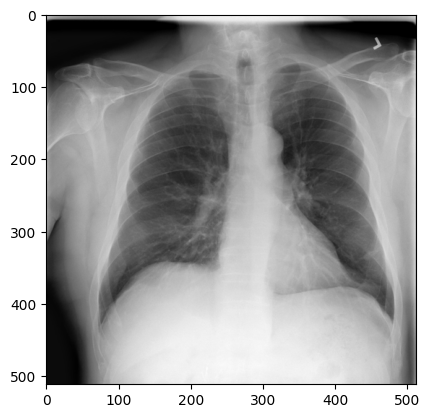

RGB
(512, 512)


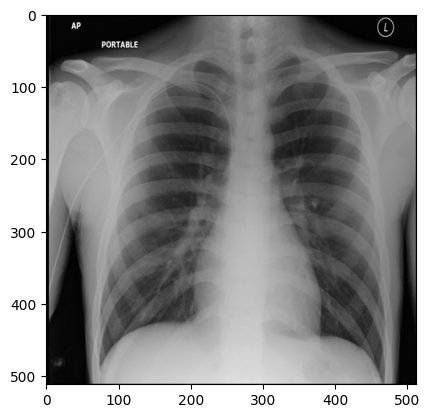

RGB
(512, 512)


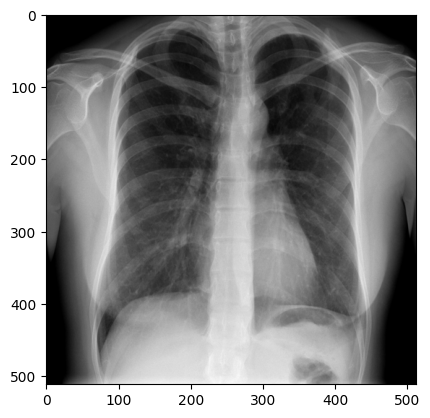

In [4]:
# range(start, stop, step)
for i in range(1,5):
    image = Image.open(
        f'../input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Normal/Normal-{i}.png')
    print(image.mode)
    print(image.size)
    plt.imshow(image)
    plt.show()

In [5]:
import numpy as np
from numpy import asarray
import os
from tqdm import tqdm

In [6]:
dir_path = '../input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/'

In [7]:
def numpize(subset: str, img_size=(128, 128), grayscale=False):
    """
    Convert a set of images from a specified subset to NumPy arrays.

    Parameters:
    - subset (str): Specifies the subset of images, e.g., 'Normal' or 'Tuberculosis'.
    - img_size (tuple): Tuple representing the desired size of the images after resizing.
    - grayscale (bool): If True, convert images to grayscale.

    Returns:
    - numpy_array (numpy.ndarray): NumPy array containing the transformed images.
    """
    image_dir = f'{dir_path}/{subset}/'
    image_files = os.listdir(image_dir)
    image_count = len(image_files)
    transformed_images = []

    for i in tqdm(range(1, image_count + 1), desc='Transforming...'):
        image_path = f'{image_dir}/{subset}-{i}.png'
        image = Image.open(image_path)

        # Ensure all images are in the same format
        if grayscale:
            image = image.convert('L')  # Convert to grayscale
        else:
            image = image.convert('RGB')  # Convert to RGB

        # Resize all images to the specified size without padding
        resized_image = image.resize(img_size)
        data = np.asarray(resized_image)
        transformed_images.append(data)

    numpy_array = np.array(transformed_images)
    return numpy_array

In [8]:
norm = numpize(subset='Normal', 
               img_size=(128, 128), 
               grayscale=False)
norm.shape

Transforming...: 100%|██████████| 3500/3500 [00:55<00:00, 62.93it/s]


(3500, 128, 128, 3)

In [9]:
tb = numpize(subset='Tuberculosis', 
             img_size=(128, 128), 
             grayscale=False)
tb.shape

Transforming...: 100%|██████████| 700/700 [00:10<00:00, 66.06it/s]


(700, 128, 128, 3)

In [10]:
target_norm = np.zeros(norm.shape[0])
print(f'Shape: {target_norm.shape[0]}, array: {target_norm}')

Shape: 3500, array: [0. 0. 0. ... 0. 0. 0.]


In [11]:
target_tb = np.ones(tb.shape[0])
print(f'Shape: {target_tb.shape[0]}, array: {target_tb}')

Shape: 700, array: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

In [12]:
import cv2
import os
import numpy as np

def get_training_data(data_dir):
    data = []
    
    for label in ['NORMAL', 'PNEUMONIA']:
        path = os.path.join(data_dir, label)
        class_num = 0 if label == 'NORMAL' else 1
        
        for img in os.listdir(path):
            try:
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_COLOR)
                resized_img = cv2.resize(img_array, (128, 128))
                
                # Ensure the image is of shape (128, 128, 3)
                if resized_img.shape == (128, 128, 3):
                    data.append([resized_img, class_num])
                else:
                    print(f"Ignoring {img} due to incorrect shape: {resized_img.shape}")
                    
            except Exception as e:
                print(f"Error reading image {img}: {e}")
                
    # Convert list of lists to numpy array
    data_array = np.array([i for i, _ in data]), np.array([j for _, j in data])
    
    return data_array

train_data = get_training_data('../input/chest-xray-pneumonia/chest_xray/chest_xray/train')
test_data = get_training_data('../input/chest-xray-pneumonia/chest_xray/chest_xray/test')
val_data = get_training_data('../input/chest-xray-pneumonia/chest_xray/chest_xray/val')

train_images, train_labels = train_data
test_images, test_labels = test_data
val_images, val_labels = val_data


Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'

Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'

Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'

Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



3875
1341


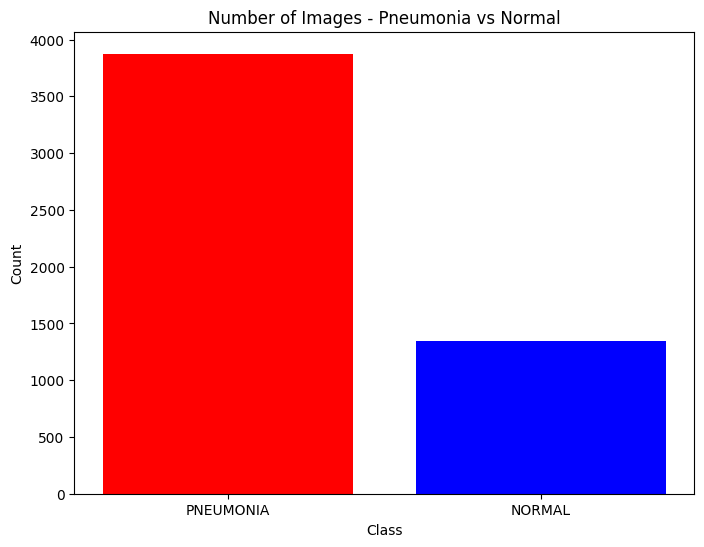

In [13]:
# Counting the number of images for each class
pneumonia_count = np.sum(train_labels == 1)
normal_count = np.sum(train_labels == 0)

print(pneumonia_count)
print(normal_count)

# Plotting the counts
labels = ['PNEUMONIA', 'NORMAL']
counts = [pneumonia_count, normal_count]

plt.figure(figsize=(8, 6))
plt.bar(labels, counts, color=['red', 'blue'])
plt.title('Number of Images - Pneumonia vs Normal')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

In [14]:
def numpize(subset: str, img_size=(128, 128), grayscale=False):
    """
    Convert a set of images from a specified subset to NumPy arrays.

    Parameters:
    - subset (str): Specifies the subset of images, e.g., 'Normal' or 'Tuberculosis'.
    - img_size (tuple): Tuple representing the desired size of the images after resizing.
    - grayscale (bool): If True, convert images to grayscale.

    Returns:
    - numpy_array (numpy.ndarray): NumPy array containing the transformed images.
    """
    image_dir = f'{dir_path}/{subset}/'
    image_files = os.listdir(image_dir)
    image_count = len(image_files)
    transformed_images = []

    for i in tqdm(range(1, image_count + 1), desc='Transforming...'):
        image_path = f'{image_dir}/{subset}-{i}.png'
        image = Image.open(image_path)
        
        

        # Ensure all images are in the same format
        if grayscale:
            image = image.convert('L')  # Convert to grayscale
        else:
            image = image.convert('RGB')  # Convert to RGB

        # Resize all images to the specified size without padding
        resized_image = image.resize(img_size)
        data = np.asarray(resized_image)
        transformed_images.append(data)

    numpy_array = np.array(transformed_images)
    return numpy_array

Transforming train NORMAL...:  81%|████████  | 1081/1342 [00:26<00:05, 43.93it/s]

Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



Transforming train PNEUMONIA...:  81%|████████  | 3130/3876 [00:26<00:06, 108.78it/s]

Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



Transforming val NORMAL...: 100%|██████████| 9/9 [00:00<00:00, 70.48it/s]


Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



Transforming val PNEUMONIA...: 100%|██████████| 9/9 [00:00<00:00, 142.93it/s]


Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



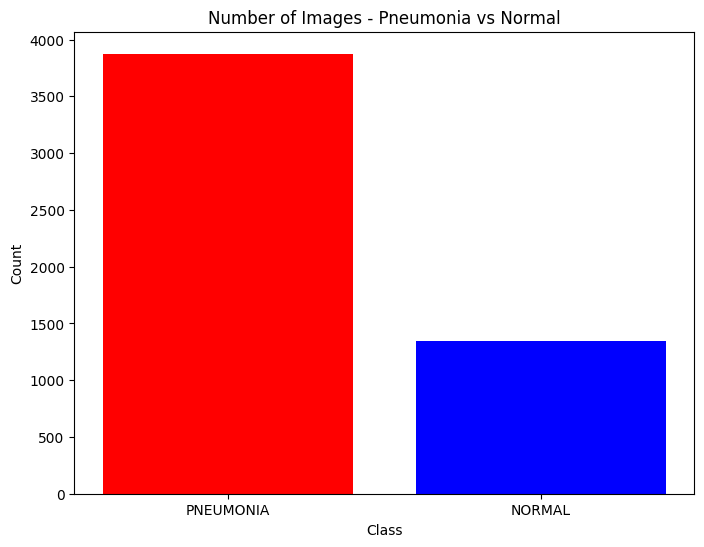

In [15]:
import cv2
import os
import numpy as np
from PIL import Image
from tqdm import tqdm

def numpize(subset: str, img_size=(128, 128), grayscale=False):
    """
    Convert a set of images from a specified subset to NumPy arrays.

    Parameters:
    - subset (str): Specifies the subset of images, e.g., 'Normal' or 'Pneumonia'.
    - img_size (tuple): Tuple representing the desired size of the images after resizing.
    - grayscale (bool): If True, convert images to grayscale.

    Returns:
    - numpy_array (numpy.ndarray): NumPy array containing the transformed images.
    """
    data = []
    image_dir = f'../input/chest-xray-pneumonia/chest_xray/chest_xray/{subset}/'
    
    for label in ['NORMAL', 'PNEUMONIA']:
        path = os.path.join(image_dir, label)
        class_num = 0 if label == 'NORMAL' else 1
        
        for img in tqdm(os.listdir(path), desc=f'Transforming {subset} {label}...', total=len(os.listdir(path))):
            try:
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_COLOR)
                resized_img = cv2.resize(img_array, img_size)
                
                # Ensure the image is of shape (img_size[0], img_size[1], 3)
                if resized_img.shape == (*img_size, 3):
                    data.append([resized_img, class_num])
                else:
                    print(f"Ignoring {img} due to incorrect shape: {resized_img.shape}")
                    
            except Exception as e:
                print(f"Error reading image {img}: {e}")
                
    # Convert list of lists to numpy array
    images_array = np.array([i for i, _ in data])
    labels_array = np.array([j for _, j in data])
    
    return images_array, labels_array

# Get the numpy arrays for training, test, and validation sets
train_images, train_labels = numpize('train')
test_images, test_labels = numpize('test')
val_images, val_labels = numpize('val')

# Counting the number of images for each class
pneumonia_count = np.sum(train_labels == 1)
normal_count = np.sum(train_labels == 0)

# Plotting the counts
labels = ['PNEUMONIA', 'NORMAL']
counts = [pneumonia_count, normal_count]

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.bar(labels, counts, color=['red', 'blue'])
plt.title('Number of Images - Pneumonia vs Normal')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()


Transforming train NORMAL...:  81%|████████  | 1086/1342 [00:26<00:05, 50.23it/s]

Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



Transforming train PNEUMONIA...:  81%|████████  | 3130/3876 [00:25<00:06, 111.99it/s]

Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



Transforming val NORMAL...: 100%|██████████| 9/9 [00:00<00:00, 71.02it/s]


Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



Transforming val PNEUMONIA...: 100%|██████████| 9/9 [00:00<00:00, 126.75it/s]


Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



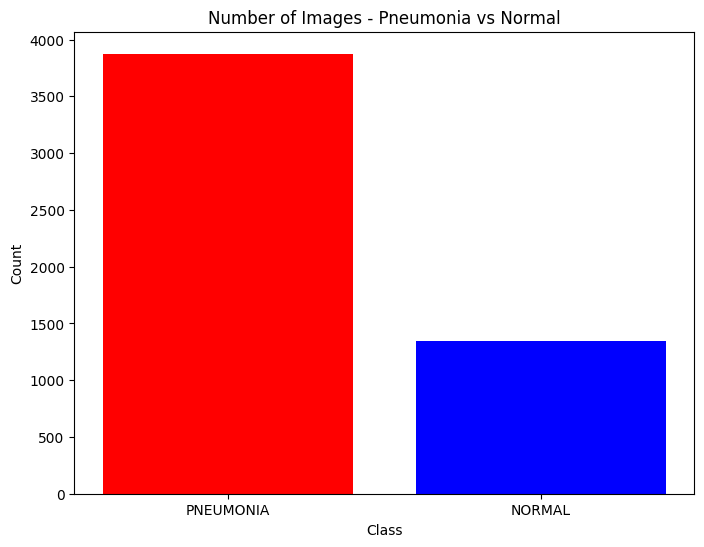

In [16]:
import cv2
import os
import numpy as np
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

def numpize(subset: str, img_size=(128, 128), grayscale=False):
    """
    Convert a set of images from a specified subset to NumPy arrays.

    Parameters:
    - subset (str): Specifies the subset of images, e.g., 'Normal' or 'Pneumonia'.
    - img_size (tuple): Tuple representing the desired size of the images after resizing.
    - grayscale (bool): If True, convert images to grayscale.

    Returns:
    - numpy_array (numpy.ndarray): NumPy array containing the transformed images.
    """
    data = []
    image_dir = f'../input/chest-xray-pneumonia/chest_xray/chest_xray/{subset}/'
    
    pneumonia = []
    normal = []
    
    for label in ['NORMAL', 'PNEUMONIA']:
        path = os.path.join(image_dir, label)
        class_num = 0 if label == 'NORMAL' else 1
        
        for img in tqdm(os.listdir(path), desc=f'Transforming {subset} {label}...', total=len(os.listdir(path))):
            try:
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_COLOR)
                resized_img = cv2.resize(img_array, img_size)
                
                # Ensure the image is of shape (img_size[0], img_size[1], 3)
                if resized_img.shape == (*img_size, 3):
                    data.append([resized_img, class_num])
                    
                    if label == 'NORMAL':
                        normal.append(resized_img)
                    else:
                        pneumonia.append(resized_img)
                        
                else:
                    print(f"Ignoring {img} due to incorrect shape: {resized_img.shape}")
                    
            except Exception as e:
                print(f"Error reading image {img}: {e}")
                
    # Convert list of lists to numpy array
    images_array = np.array([i for i, _ in data])
    labels_array = np.array([j for _, j in data])
    
    target_pneumonia = np.array(pneumonia)
    target_normal = np.array(normal)
    
    return images_array, labels_array, pneumonia, normal, target_pneumonia, target_normal

# Get the numpy arrays for training, test, and validation sets
train_images, train_labels, train_pneumonia, train_normal, target_pneumonia_train, target_normal_train = numpize('train')
test_images, test_labels, test_pneumonia, test_normal, target_pneumonia_test, target_normal_test = numpize('test')
val_images, val_labels, val_pneumonia, val_normal, target_pneumonia_val, target_normal_val = numpize('val')

# Counting the number of images for each class
pneumonia_count = np.sum(train_labels == 1)
normal_count = np.sum(train_labels == 0)

# Plotting the counts
labels = ['PNEUMONIA', 'NORMAL']
counts = [pneumonia_count, normal_count]

plt.figure(figsize=(8, 6))
plt.bar(labels, counts, color=['red', 'blue'])
plt.title('Number of Images - Pneumonia vs Normal')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()


Sample image from pneumonia:


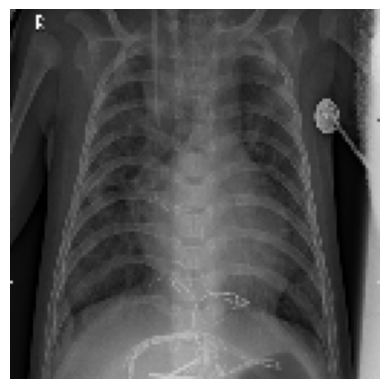

Sample image from normal:


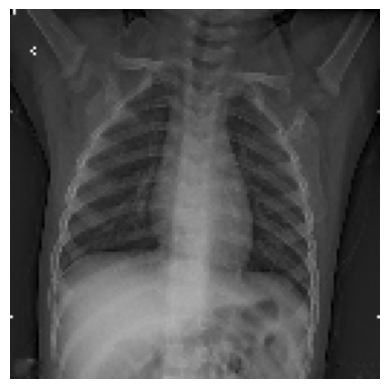

Target value for pneumonia: [[[ 73  73  73]
  [ 74  74  74]
  [  2   2   2]
  ...
  [101 101 101]
  [164 164 164]
  [190 190 190]]

 [[ 68  68  68]
  [ 10  10  10]
  [  2   2   2]
  ...
  [108 108 108]
  [161 161 161]
  [188 188 188]]

 [[ 57  57  57]
  [ 12  12  12]
  [  5   5   5]
  ...
  [115 115 115]
  [145 145 145]
  [194 194 194]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 12  12  12]
  ...
  [191 191 191]
  [193 193 193]
  [196 196 196]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 12  12  12]
  ...
  [191 191 191]
  [194 194 194]
  [192 192 192]]

 [[ 13  13  13]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [189 189 189]
  [197 197 197]
  [197 197 197]]]
Target value for normal: [[[  6   6   6]
  [251 251 251]
  [ 42  42  42]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [230 230 230]
  [ 43  43  43]
  ...
  [ 13  13  13]
  [ 18  18  18]
  [  1   1   1]]

 [[ 43  43  43]
  [ 45  45  45]
  [ 41  41  41]
  ...
  [ 31  31  31]
  [ 25  25  25]
  [  1   1   1]]

 ...


In [17]:
# To see the contents of the variables
print("Sample image from pneumonia:")
plt.imshow(train_pneumonia[0])
plt.axis('off')
plt.show()

print("Sample image from normal:")
plt.imshow(train_normal[0])
plt.axis('off')
plt.show()

print("Target value for pneumonia:", target_pneumonia_train[0])
print("Target value for normal:", target_normal_train[0])

Transforming train NORMAL...:  80%|████████  | 1079/1342 [00:26<00:06, 43.03it/s]

Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



Transforming train PNEUMONIA...:  81%|████████  | 3131/3876 [00:25<00:06, 112.68it/s]

Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



Transforming val NORMAL...: 100%|██████████| 9/9 [00:00<00:00, 70.06it/s]


Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



Transforming val PNEUMONIA...: 100%|██████████| 9/9 [00:00<00:00, 126.74it/s]


Error reading image .DS_Store: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



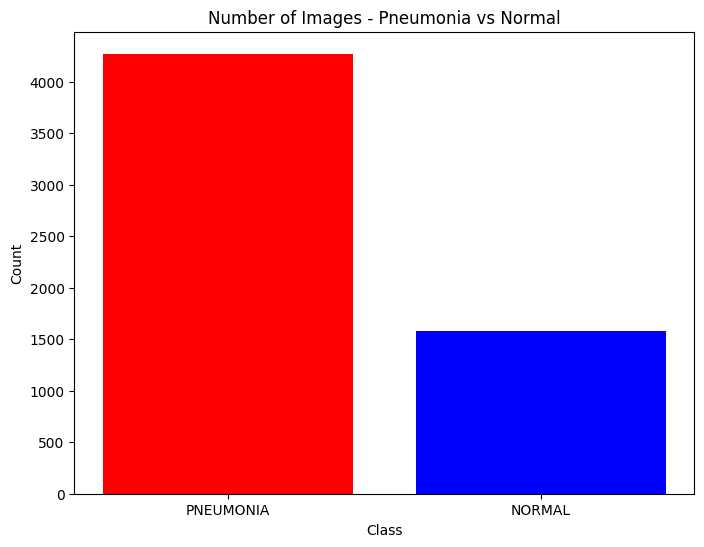

Sample image from pneumonia:


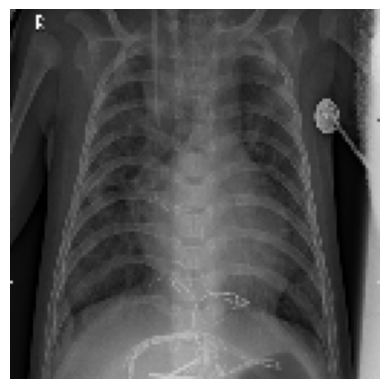

Sample image from normal:


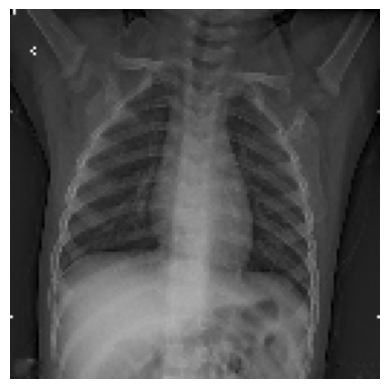

In [18]:
import cv2
import os
import numpy as np
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

def numpize(subset: str, img_size=(128, 128), grayscale=False):
    """
    Convert a set of images from a specified subset to NumPy arrays.

    Parameters:
    - subset (str): Specifies the subset of images, e.g., 'Normal' or 'Pneumonia'.
    - img_size (tuple): Tuple representing the desired size of the images after resizing.
    - grayscale (bool): If True, convert images to grayscale.

    Returns:
    - numpy_array (numpy.ndarray): NumPy array containing the transformed images.
    """
    data = []
    image_dir = f'../input/chest-xray-pneumonia/chest_xray/chest_xray/{subset}/'
    
    pneumonia = []
    normal = []
    
    for label in ['NORMAL', 'PNEUMONIA']:
        path = os.path.join(image_dir, label)
        class_num = 0 if label == 'NORMAL' else 1
        
        for img in tqdm(os.listdir(path), desc=f'Transforming {subset} {label}...', total=len(os.listdir(path))):
            try:
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_COLOR)
                resized_img = cv2.resize(img_array, img_size)
                
                # Ensure the image is of shape (img_size[0], img_size[1], 3)
                if resized_img.shape == (*img_size, 3):
                    data.append([resized_img, class_num])
                    
                    if label == 'NORMAL':
                        normal.append(resized_img)
                    else:
                        pneumonia.append(resized_img)
                        
                else:
                    print(f"Ignoring {img} due to incorrect shape: {resized_img.shape}")
                    
            except Exception as e:
                print(f"Error reading image {img}: {e}")
                
    # Convert list of lists to numpy array
    images_array = np.array([i for i, _ in data])
    labels_array = np.array([j for _, j in data])
    
    target_pneumonia = np.array(pneumonia)
    target_normal = np.array(normal)
    
    return images_array, labels_array, pneumonia, normal, target_pneumonia, target_normal

# Get the numpy arrays for training, test, and validation sets
train_images, train_labels, train_pneumonia, train_normal, target_pneumonia_train, target_normal_train = numpize('train')
test_images, test_labels, test_pneumonia, test_normal, target_pneumonia_test, target_normal_test = numpize('test')
val_images, val_labels, val_pneumonia, val_normal, target_pneumonia_val, target_normal_val = numpize('val')

# Condense normal and pneumonia images into single variables
normal = np.concatenate((train_normal, test_normal, val_normal), axis=0)
pneumonia = np.concatenate((train_pneumonia, test_pneumonia, val_pneumonia), axis=0)

# Counting the number of images for each class
pneumonia_count = np.sum(train_labels == 1) + np.sum(test_labels == 1) + np.sum(val_labels == 1)
normal_count = np.sum(train_labels == 0) + np.sum(test_labels == 0) + np.sum(val_labels == 0)

# Plotting the counts
labels = ['PNEUMONIA', 'NORMAL']
counts = [pneumonia_count, normal_count]

plt.figure(figsize=(8, 6))
plt.bar(labels, counts, color=['red', 'blue'])
plt.title('Number of Images - Pneumonia vs Normal')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

# To see the contents of the variables
print("Sample image from pneumonia:")
plt.imshow(pneumonia[0])
plt.axis('off')
plt.show()

print("Sample image from normal:")
plt.imshow(normal[0])
plt.axis('off')
plt.show()

# print("Target value for pneumonia:", target_pneumonia_train[0])
# print("Target value for normal:", target_normal_train[0])


In [19]:
#normal from the pneumonia dataset
target_normal = np.zeros(normal.shape[0])
print(f'Shape: {target_normal.shape[0]}, array: {target_normal}')

Shape: 1583, array: [0. 0. 0. ... 0. 0. 0.]


In [20]:

# Condense all normal images for tb and pneumonia into one array
# normal = np.concatenate((norm, normal), axis=0)
normal = np.concatenate((normal[:375], norm), axis=0)
print(f'Shape: {normal.shape[0]}, array: {normal}')



Shape: 3875, array: [[[[  6   6   6]
   [251 251 251]
   [ 42  42  42]
   ...
   [  0   0   0]
   [  0   0   0]
   [  0   0   0]]

  [[  1   1   1]
   [230 230 230]
   [ 43  43  43]
   ...
   [ 13  13  13]
   [ 18  18  18]
   [  1   1   1]]

  [[ 43  43  43]
   [ 45  45  45]
   [ 41  41  41]
   ...
   [ 31  31  31]
   [ 25  25  25]
   [  1   1   1]]

  ...

  [[ 31  31  31]
   [ 41  41  41]
   [ 54  54  54]
   ...
   [ 35  35  35]
   [ 34  34  34]
   [ 38  38  38]]

  [[ 39  39  39]
   [ 37  37  37]
   [ 46  46  46]
   ...
   [ 39  39  39]
   [ 42  42  42]
   [ 36  36  36]]

  [[ 27  27  27]
   [ 35  35  35]
   [ 34  34  34]
   ...
   [ 41  41  41]
   [ 37  37  37]
   [ 35  35  35]]]


 [[[106 106 106]
   [ 95  95  95]
   [100 100 100]
   ...
   [ 63  63  63]
   [ 74  74  74]
   [ 75  75  75]]

  [[112 112 112]
   [ 92  92  92]
   [ 97  97  97]
   ...
   [ 69  69  69]
   [ 75  75  75]
   [ 77  77  77]]

  [[152 152 152]
   [ 90  90  90]
   [ 96  96  96]
   ...
   [ 78  78  78]
   [ 74 

In [21]:
target_normal = np.zeros(normal.shape[0])
print(f'Shape: {target_normal.shape[0]}, array: {target_normal}')

Shape: 3875, array: [0. 0. 0. ... 0. 0. 0.]


In [22]:
target_tb = np.ones(tb.shape[0])
print(f'Shape: {target_tb.shape[0]}, array: {target_tb}')

Shape: 700, array: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

In [23]:
target_pneumonia = np.ones(pneumonia.shape[0]) * 2
print(f'Shape: {target_pneumonia.shape[0]}, array: {target_pneumonia}')

Shape: 4273, array: [2. 2. 2. ... 2. 2. 2.]


Sample image from pneumonia:


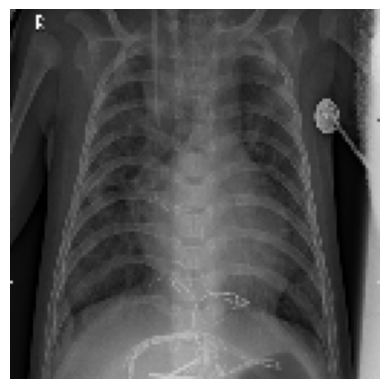

Sample image from pneumonia:


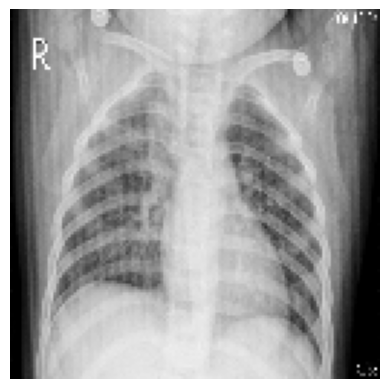

Sample image from pneumonia:


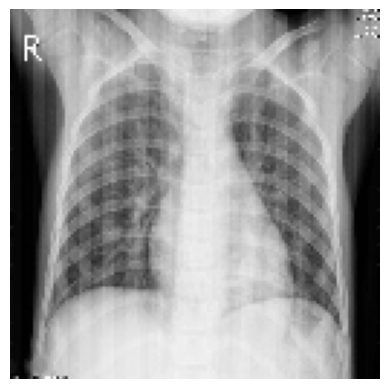

Sample image from pneumonia:


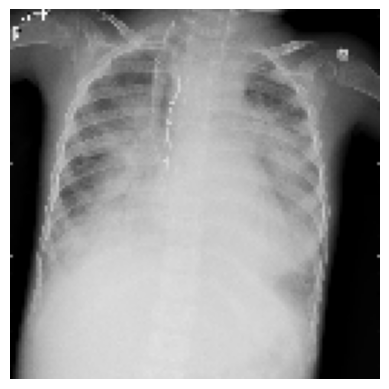

Sample image from pneumonia:


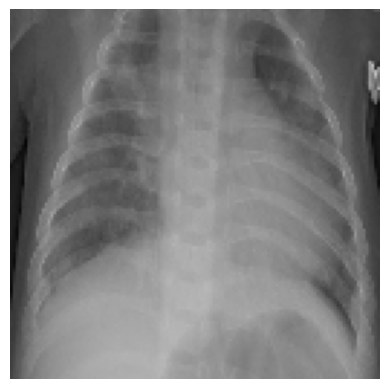

Sample image from pneumonia:


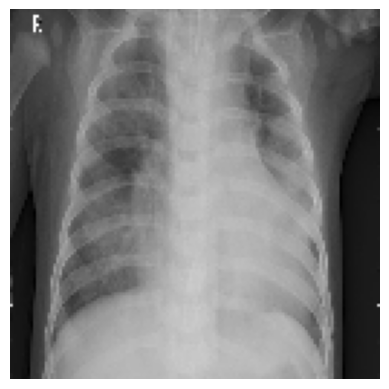

Sample image from pneumonia:


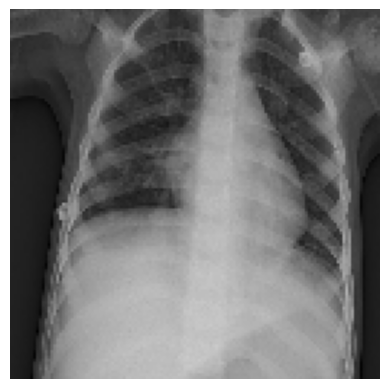

Sample image from pneumonia:


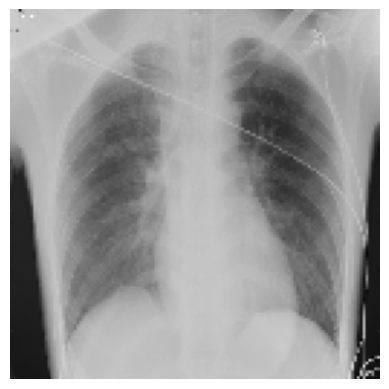

Sample image from pneumonia:


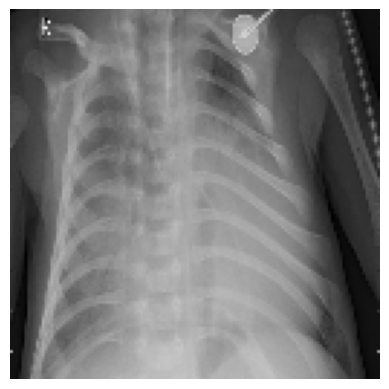

Sample image from pneumonia:


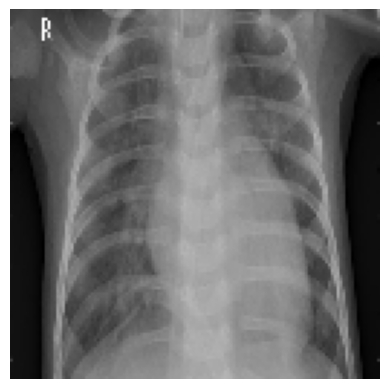

In [24]:
for i in range (10):
    print("Sample image from pneumonia:")
    plt.imshow(pneumonia[i])
    plt.axis('off')
    plt.show()

In [25]:
print('Hello world')

Hello world


In [26]:
def show_image(images, target, title, num_display=16, num_cols=4, cmap='gray', random_mode=False):
    '''
    :Parameters
        images (ndarray (n,)): Input data as a numpy array.
        target (ndarray (n,)): Target data as a numpy array.
        title (String): Title of the plot.
        num_display (int): Number of images to display. Default is 16.
        num_cols (int): Number of columns in the plot. Default is 4.
        cmap (str): Color map for displaying images. Default is 'gray'.
        random_mode (bool): If True, display images randomly. If False, display the first num_display images. Default is False.
    '''
    # Determine the number of rows based on the num_cols parameter
    n_cols = min(num_cols, num_display)
    n_rows = int(np.ceil(num_display / n_cols))

    n_images = min(num_display, len(images))
    if random_mode:
        random_indices = np.random.choice(
            len(images), num_display, replace=False)
    else:
        random_indices = np.arange(num_display)

    fig, axes = plt.subplots(
        nrows=n_rows, ncols=n_cols, figsize=(20, 4*n_rows))
    for i, ax in enumerate(axes.flatten()):
        if i >= n_images:  # Check if the index exceeds the available number of images
            break
        # Incase (Did PCA)
        index = random_indices[i]
        if len(images.shape) == 2:
            image = images[index].reshape((128, 128)).astype(int)
        else:
            image = images[index]

        ax.imshow(image, cmap=cmap)
        ax.set_title("Target: {}".format(target[index]))

        # Add image index as text
        ax.text(0.5, -0.15, f'Image Index: {index}', transform=ax.transAxes,
                fontsize=10, ha='center')

    plt.suptitle(f"{title} (Displaying {num_display} Images)",
                 fontsize=16, fontweight='bold')

    fig.set_facecolor('white')
    plt.tight_layout() 
    return plt.show()

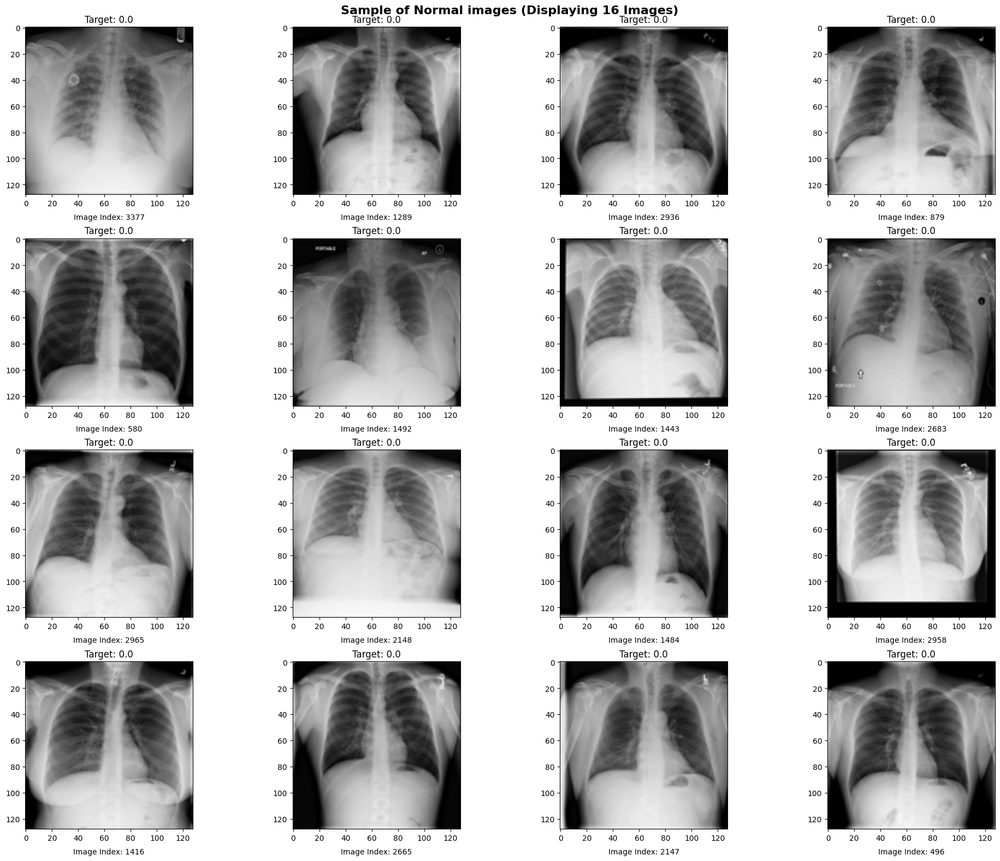

In [27]:
show_image(images=normal, 
           target=target_normal,
           title='Sample of Normal images',
           num_display=16, 
           num_cols=4, 
           cmap='gray', 
           random_mode=True)

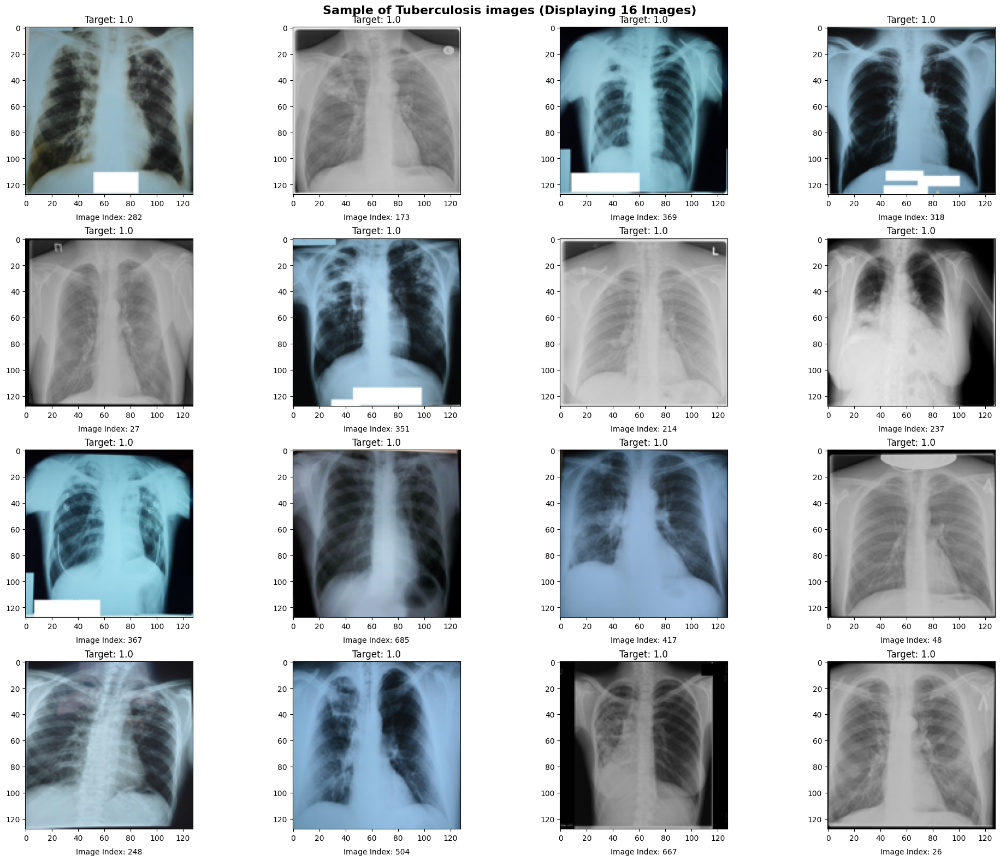

In [28]:
show_image(images=tb, 
           target=target_tb,
           title='Sample of Tuberculosis images',
           num_display=16, 
           num_cols=4, 
           cmap='gray', 
           random_mode=True)

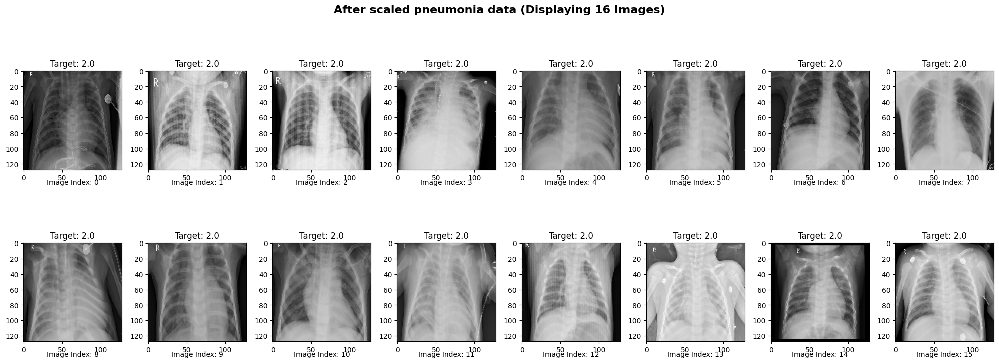

In [29]:
show_image(images=pneumonia,
           target=target_pneumonia,
           title='After scaled pneumonia data', 
           num_display=16, 
           num_cols=8, 
           cmap='gray', 
           random_mode=False)

In [30]:
from skimage import img_as_float
from skimage import exposure

In [31]:
def plot_gray_scale_histogram(images, titles, bins=100):
    '''
    Plot Gray Scale Histograms of Images.

    Parameters:
        - images (list): List of grayscale images to plot histograms for.
        - titles (list): List of titles for each histogram.
        - bins (int, optional): Number of bins for the histogram. Default is 100.

    Returns:
        None

    This function generates histograms for a list of grayscale images and displays them side by side. Each histogram is accompanied by its respective title.

    The function does not return any values; it displays the histogram plots directly.
    '''
    # Display results
    fig, axes = plt.subplots(2, len(images), figsize=(20, 8))

    for i, (title, image) in enumerate(zip(titles, images)):
        ax_img, ax_hist, ax_cdf, random_index = img_and_hist(
            image, axes[:, i], bins)

        mean_value = np.mean(image)
        std_value = np.std(image)
        min_value = np.min(image)
        max_value = np.max(image)

        ax_img.set_title('Random image of '+r'$\bf{' + f'{title}'+'}$' +
                         f'\nMean: {mean_value: .2f}, Std: {std_value: .2f}, Min: {min_value: .2f}, Max: {max_value: .2f}', fontsize=16)
        ax_img.text(0.5, -0.15, f'Image Index: {random_index}\n(Display random image)', transform=ax_img.transAxes,
                    fontsize=10, ha='center')

        y_min, y_max = ax_hist.get_ylim()
        ax_hist.set_title(
            'Distribution of pixel intensities of'+r'$\bf{' + f'{title}'+'}$', fontsize=16)
        ax_hist.set_ylabel('Number of pixels')
        ax_hist.set_yticks(np.linspace(0, y_max, 5))

        ax_cdf.set_ylabel('Fraction of total intensity')
        ax_cdf.set_yticks(np.linspace(0, 1, 5))

    plt.suptitle('Gray scale Histogram: Distribution of intensity pixel',
                 fontsize=16, fontweight='bold')
    # Prevent overlap of y-axis labels
    fig.tight_layout()
    plt.show()


def img_and_hist(image_data, axes, bins=100):
    '''
    Plot an image along with its histogram and cumulative histogram.

    Parameters:
        - image_data (ndarray): Grayscale image data as a numpy array.
        - axes (list): List of axes for displaying the image, histogram, and cumulative histogram.
        - bins (int): Number of bins for the histogram.

    Returns:
        - ax_img, ax_hist, ax_cdf: Axes objects for image, histogram, and cumulative histogram.

    This function displays an image along with its histogram and cumulative histogram. It takes the grayscale image data, a list of axes for plotting, and the number of bins for the histogram.

    The function returns the axes objects for the image, histogram, and cumulative histogram.
    '''

    '''
    Plot an image along with its histogram and cumulative histogram.
    '''
    image = img_as_float(image_data)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    random_index = np.random.randint(0, len(image_data))

    # Display image
    ax_img.imshow(image if image.shape[0] ==1 else image[random_index], cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    # ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf, random_index

**Preprocessing**

In [32]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random

In [33]:
def x_ray_image_augmentation(images, targets, sample_count):
    '''
    :Parameters
        df (ndarray (n,)): Input data as a numpy array.
        target (ndarray (n,)): Target data as a numpy array.
        sample_count (integer64): Number of data needed.
    '''

    # Randomize the data augmentation parameters
    rotation_range = random.randint(-5, 5)
    # width_shift_range = random.uniform(0.0, 0.05)      Not reccomend
    # height_shift_range = random.uniform(0.0, 0.05)     Not reccomend
    # shear_range = random.uniform(0.0, 0.1)             Not reccomend
    zoom_range = random.uniform(0.0, 0.1)
    fill_mode = random.choice(['nearest',
                               'constant',
                               #    'reflect',               Not reccomend
                               'wrap'])

    # Create the ImageDataGenerator with randomized parameters
    datagen = ImageDataGenerator(
        rotation_range=rotation_range,
        # width_shift_range=width_shift_range,             Not reccomend
        # height_shift_range=height_shift_range,           Not reccomend
        # shear_range=shear_range,                         Not reccomend
        zoom_range=zoom_range,
        fill_mode=fill_mode
    )
    # Load and augment the data

    augmented_data_generator = datagen.flow(images, targets, batch_size=1)
    batch_images, batch_labels = next(augmented_data_generator)
    for _ in tqdm(range(sample_count), desc='augmenting...'):
        batch_images, batch_labels = next(augmented_data_generator)
        try:
            combined_images = np.concatenate(
                (combined_images, batch_images), axis=0)
            combined_labels = np.concatenate(
                (combined_labels, batch_labels), axis=0)
        except NameError:
            combined_images = np.concatenate((images, batch_images), axis=0)
            combined_labels = np.concatenate((targets, batch_labels), axis=0)
    '''
    Returns:
        combined_images (ndarray (n,)) : generated images
        combined_labels (ndarray (n,)) : generated labels
    '''
    #SAVE THE AUGMENETED DATA
#     np.savez(save_path, images=combined_images, labels=combined_labels)

    return combined_images, combined_labels


In [34]:
# Scaled the dataset before do Augmentation 
norm = norm/255
tb = tb/255
pneumonia = pneumonia/255

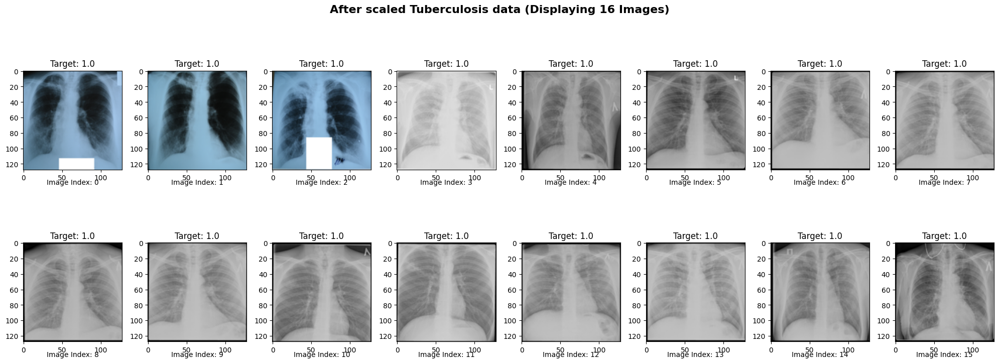

In [35]:
show_image(images=tb,
           target=target_tb,
           title='After scaled Tuberculosis data', 
           num_display=16, 
           num_cols=8, 
           cmap='gray', 
           random_mode=False)

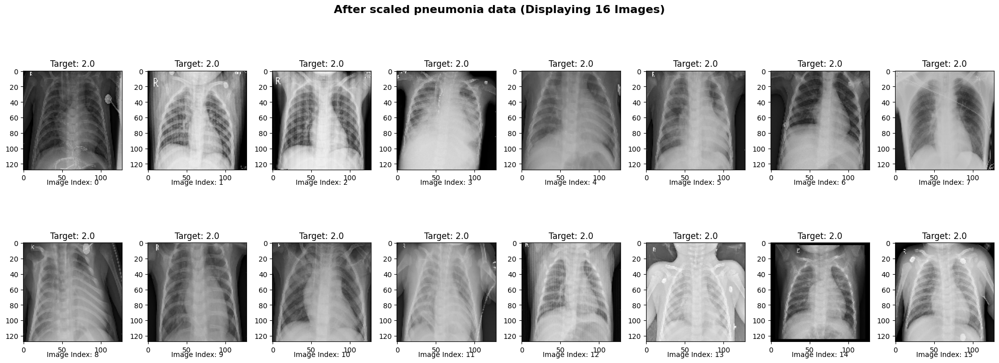

In [36]:
show_image(images=pneumonia,
           target=target_pneumonia,
           title='After scaled pneumonia data', 
           num_display=16, 
           num_cols=8, 
           cmap='gray', 
           random_mode=False)

In [37]:
tb_augmented, target_tb_augmented = x_ray_image_augmentation(images=tb, 
                                                             targets=target_tb, 
                                                             sample_count=1000)

augmenting...: 100%|██████████| 1000/1000 [02:56<00:00,  5.67it/s]


In [38]:
tb_augmented.shape

(1700, 128, 128, 3)

In [39]:
tb_augmented.shape

(1700, 128, 128, 3)

In [40]:
print(
    f'Before {tb.shape[0]}\nAfter Data Augmentation {tb_augmented.shape[0]}\n+{tb_augmented.shape[0]-tb.shape[0]} Training examples')

Before 700
After Data Augmentation 1700
+1000 Training examples


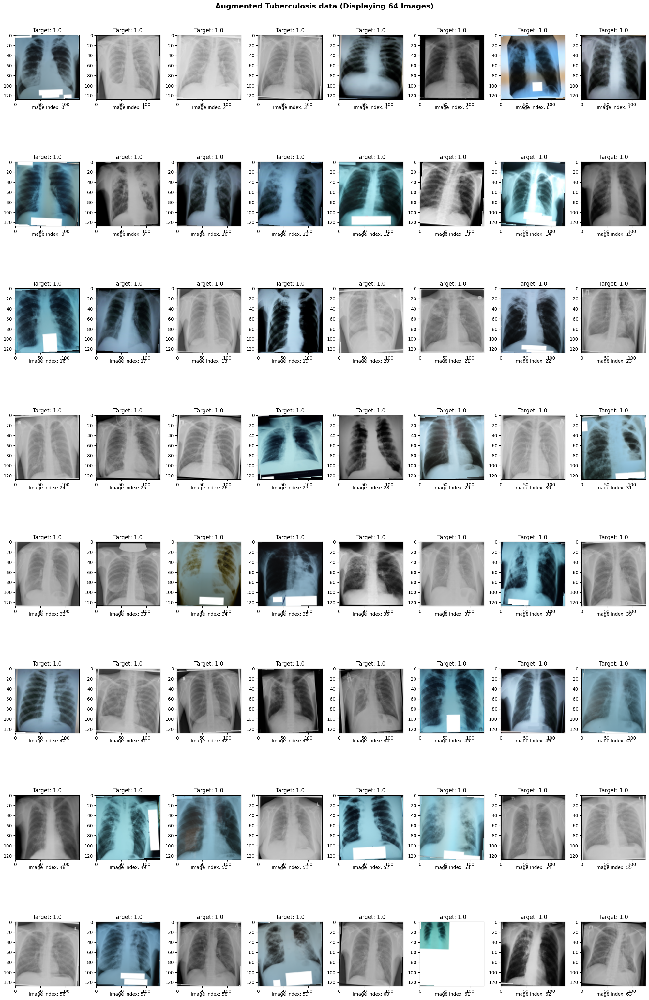

In [41]:
# Start index since 700 to last to observe to new training images
show_image(images=tb_augmented[700:-1],
           target=target_tb_augmented[700:-1],
           title='Augmented Tuberculosis data', 
           num_display=64, 
           num_cols=8, 
           cmap='gray', 
           random_mode=False)

In [42]:
pneumonia_augmented, target_pneumonia_augmented = x_ray_image_augmentation(images=pneumonia, 
                                                             targets=target_pneumonia, 
                                                             sample_count=1)

augmenting...: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


In [43]:
# pneumonia_augmented, target_pneumonia_augmented = x_ray_image_augmentation(
#     images=pneumonia, 
#     targets=target_pneumonia, 
#     sample_count=10,
#     save_path='C:\\Users\\Admin\\Documents\\Classwork\\PROJECT\\pneumonia_augmented_data.npz'
# )


In [44]:
# save_path = '/kaggle/working/pneumonia_augmented_data.npz'
# pneumonia_augmented, target_pneumonia_augmented = x_ray_image_augmentation(
#     images=pneumonia, 
#     targets=target_pneumonia, 
#     sample_count=3,
#     save_path=save_path
# )

# from IPython.display import FileLink
# FileLink(save_path)


In [45]:
pneumonia_augmented.shape

# pneumonia_augmented = pneumonia_augmented[:3875]


(4274, 128, 128, 3)

In [46]:
print(
    f'Before {pneumonia.shape[0]}\nAfter Data Augmentation {pneumonia_augmented.shape[0]}\n+{pneumonia_augmented.shape[0]-pneumonia.shape[0]} Training examples')

Before 4273
After Data Augmentation 4274
+1 Training examples


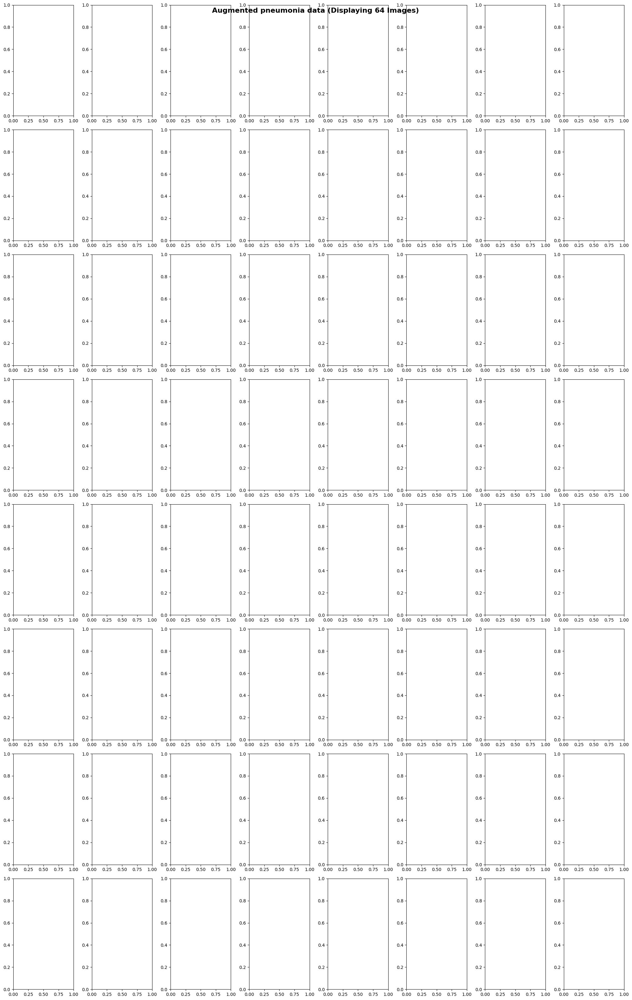

In [47]:
# Start index since 4273 to last to observe to new training images
show_image(images=pneumonia_augmented[4273:-1],
           target=target_pneumonia_augmented[4273:-1],
           title='Augmented pneumonia data', 
           num_display=64, 
           num_cols=8, 
           cmap='gray', 
           random_mode=False)

In [48]:
normal.shape

(3875, 128, 128, 3)

In [49]:
target_normal.shape

(3875,)

In [50]:
normal_augmented, target_normal_augmented = x_ray_image_augmentation(images=normal, 
                                                             targets=target_normal, 
                                                             sample_count=1)

augmenting...: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


In [51]:
normal_augmented.shape



(3876, 128, 128, 3)

In [52]:
normal = normal_augmented
target_normal =  target_normal_augmented 

normal.shape
# target_normal.shape

(3876, 128, 128, 3)

In [53]:
print(
    f'Before {normal.shape[0]}\nAfter Data Augmentation {normal.shape[0]}\n+{normal.shape[0]-normal.shape[0]} Training examples')

Before 3876
After Data Augmentation 3876
+0 Training examples


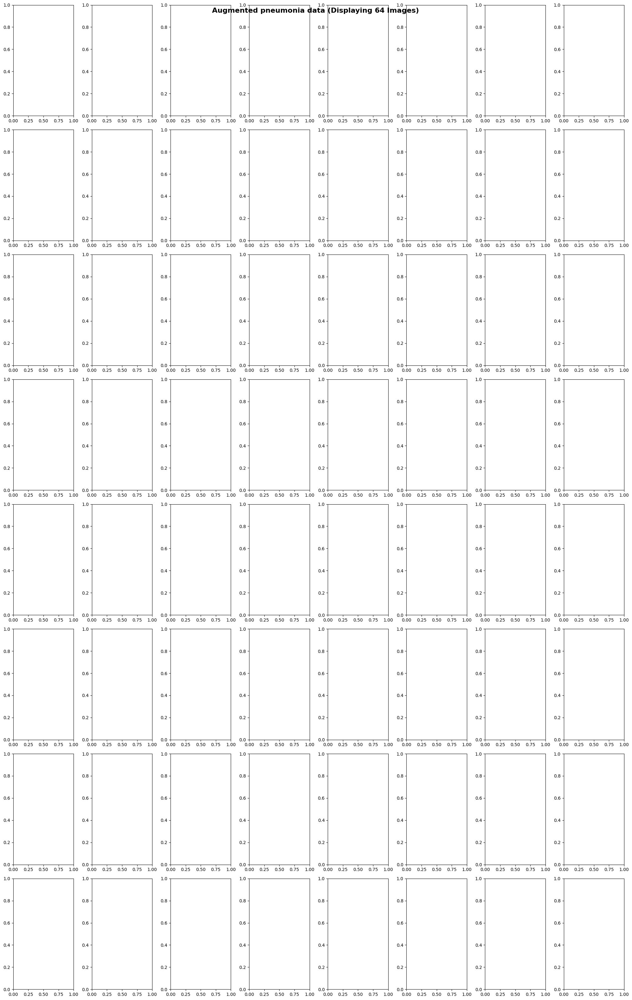

In [54]:
# Start index since 5083 to last to observe to new training images
show_image(images=pneumonia_augmented[5083:-1],
           target=target_pneumonia_augmented[5083:-1],
           title='Augmented pneumonia data', 
           num_display=64, 
           num_cols=8, 
           cmap='gray', 
           random_mode=False)

**Data preparation**

In [55]:
# Concatenate df_norm and df_tb along the first axis (samples)
X = np.concatenate((normal[:1700], tb_augmented[:1700],pneumonia_augmented[:1700]), axis=0)

# Concatenate target_norm and target_tb
y = np.concatenate((target_normal[:1700],  target_tb_augmented[:1700],target_pneumonia_augmented[:1700]), axis=0)

In [56]:
X.shape

(5100, 128, 128, 3)

In [57]:
y.shape

(5100,)

In [58]:
import pandas as pd

In [59]:
y_df = pd.DataFrame(y)
y_df.value_counts()

0  
0.0    1700
1.0    1700
2.0    1700
Name: count, dtype: int64

**1.5.1 Contrast Stretching:**

In [60]:
from skimage import exposure

In [61]:
def contrast_stretching(X):
    p2, p98 = np.percentile(X, (2, 98))
    stretched_img = exposure.rescale_intensity(X, in_range=(p2, p98))
    return stretched_img

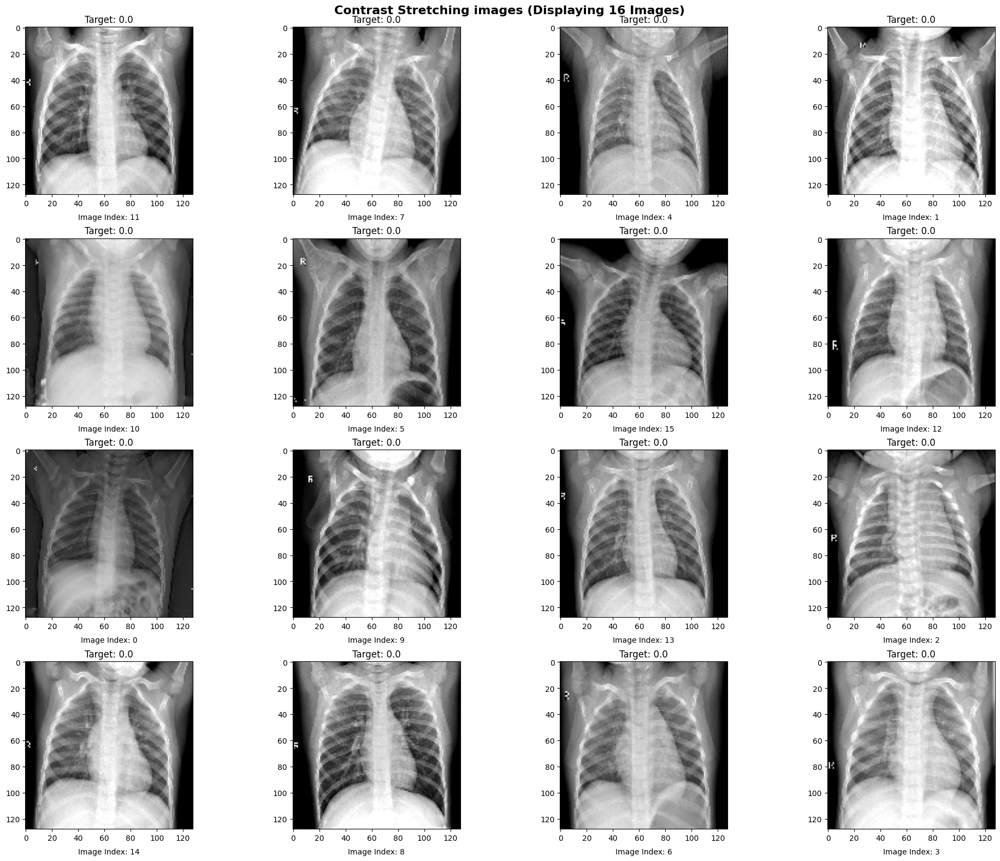

In [62]:
X_stretched = contrast_stretching(X[0:16])
show_image(images=X_stretched,
           target=y,
           title='Contrast Stretching images', 
           num_display=16, 
           num_cols=4, 
           cmap='gray', 
           random_mode=True)

**1.5.2 Histogram Equalization:**

In [63]:
def equalization(X):
    eq_img = exposure.equalize_hist(X)
    return eq_img

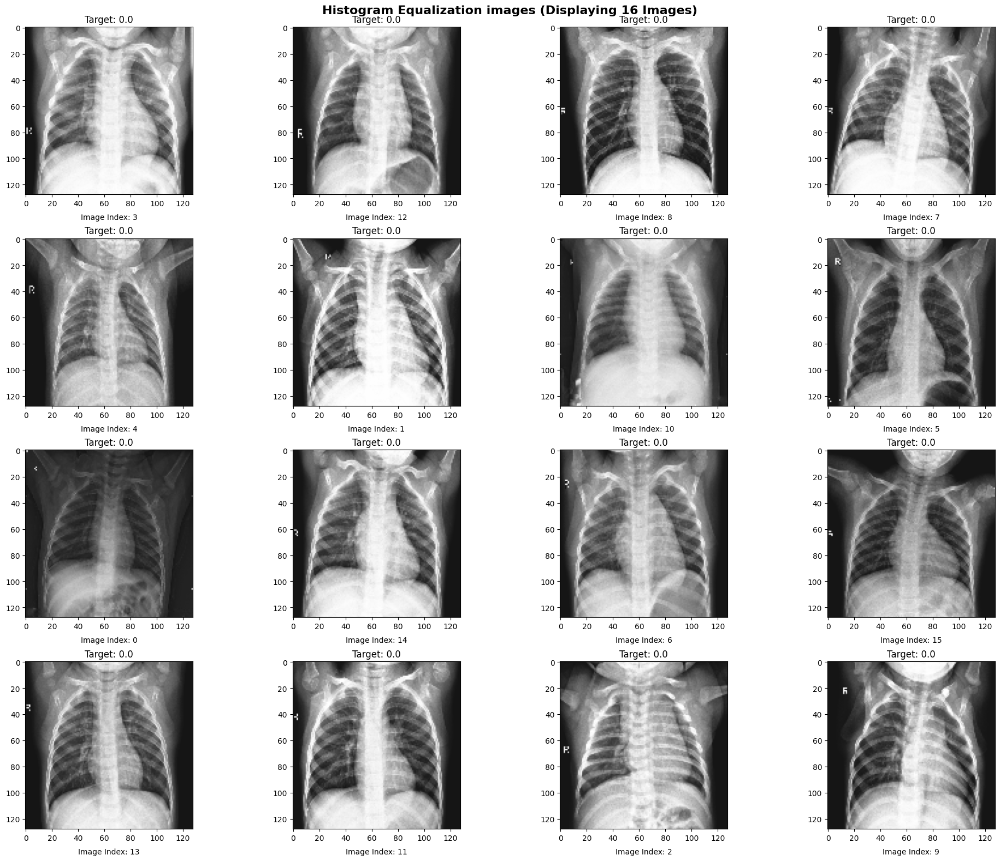

In [64]:
X_eq = equalization(X[0:16])
show_image(images=X_eq,
           target=y,
           title='Histogram Equalization images', 
           num_display=16, 
           num_cols=4, 
           cmap='gray', 
           random_mode=True)

**1.5.3 Adaptive Histogram Equalization:**

In [65]:
def adaptive_equalization(X, clip_limit, batch_size=None):
    '''
    :Parameters:
    X (ndarray (n,)): Input data as a numpy array, X.shape should be (128, 128, 1)
    clip_limit (int or float): used to control the contrast     
    batch_size (int): Size of the batch to process. If None, the entire input is processed at once.
    '''
    if batch_size is None:
        # Normalize the input image to the range of -1 to 1 and perform adaptive histogram equalization
        X_normalized = (X - np.min(X)) / (np.max(X) - np.min(X))
        X_normalized = (X_normalized * 2) - 1  # Scale to -1 to 1
        adapteq_img = exposure.equalize_adapthist(
            X_normalized, clip_limit=clip_limit)
    else:
        # Process data in batches
        num_batches = int(np.ceil(len(X) / batch_size))
        batch_results = []

        for i in tqdm(range(num_batches),desc='process...'):
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, len(X))

            # Normalize the input image to the range of -1 to 1 and perform adaptive histogram equalization for each batch
            X_normalized = (X[start_idx:end_idx] - np.min(X[start_idx:end_idx])) / \
                (np.max(X[start_idx:end_idx]) - np.min(X[start_idx:end_idx]))
            X_normalized = (X_normalized * 2) - 1  # Scale to -1 to 1
            adapteq_img_batch = exposure.equalize_adapthist(
                X_normalized, clip_limit=clip_limit)
            batch_results.append(adapteq_img_batch)

        # Concatenate the batch results
        adapteq_img = np.concatenate(batch_results, axis=0)

    return adapteq_img

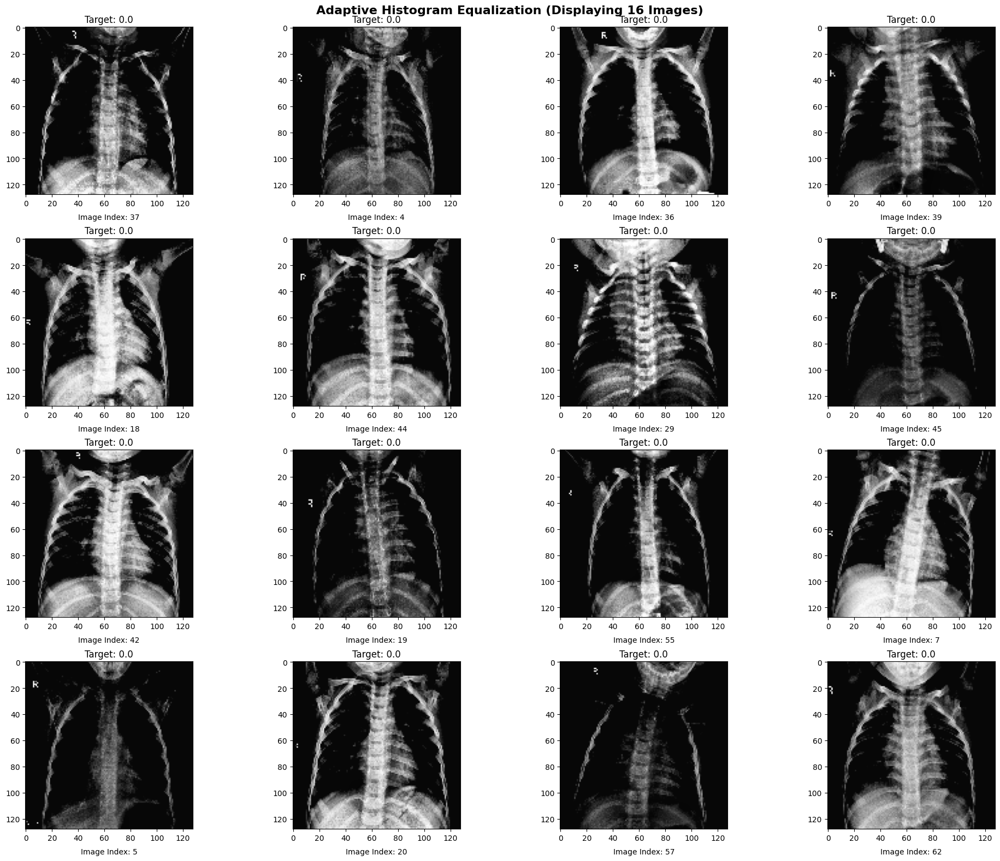

In [66]:
X_adapteq = adaptive_equalization(X[0:64],0.03)
show_image(images=X_adapteq,
            target=y,
            title='Adaptive Histogram Equalization', 
            num_display=16, 
            num_cols=4, 
            cmap='gray', 
            random_mode=True)

**1.5.4 Summary of each image enhancement**

In [67]:
sample = X[0,:,:,:]
sample.shape

(128, 128, 3)

In [68]:
# 1. Load a normal image
img = sample

# 2. Contrast stretching
img_cs = contrast_stretching(img)

# 3. Histogram Equalization
img_eq = equalization(img)

# 4. Adaptive Equalization
img_adapteq = adaptive_equalization(img, 0.03)

methods = ['Low contrast image', 'Contrast stretching',
           'Histogram equalization', 'Adaptive equalization']
images_3 = [img, img_cs, img_eq, img_adapteq]

/opt/conda/lib/python3.10/site-packages/skimage/_shared/utils.py:316: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


In [69]:
def img_and_hist_single_img(image, axes, bins=100):
    '''
    Plot an image along with its histogram and cumulative histogram.
    '''
    image = img_as_float(image)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # Display image
    ax_img.imshow(image, cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    # ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf

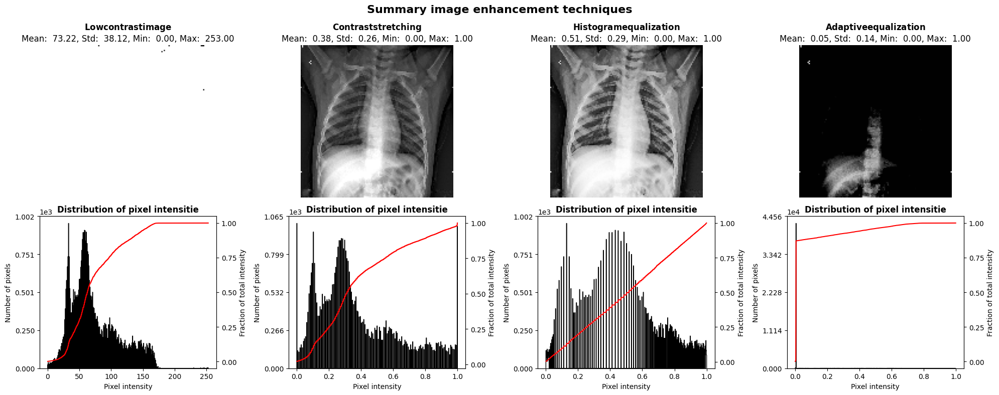

In [70]:
# Display results
fig, axes = plt.subplots(2, 4, figsize=(20, 8))

for i, (method, image) in enumerate(zip(methods, images_3)):
    ax_img, ax_hist, ax_cdf = img_and_hist_single_img(image, axes[:, i], bins=555)

    mean_value = np.mean(image)
    std_value = np.std(image)
    min_value = np.min(image)
    max_value = np.max(image)

    ax_img.set_title(
        r'$\bf{' + f'{method}'+'}$'+f'\nMean: {mean_value: .2f}, Std: {std_value: .2f}, Min: {min_value: .2f}, Max: {max_value: .2f}', fontsize=12)

    y_min, y_max = ax_hist.get_ylim()
    ax_hist.set_title(
        'Distribution of pixel intensitie', fontsize=12, fontweight='bold')
    ax_hist.set_ylabel('Number of pixels')
    ax_hist.set_yticks(np.linspace(0, y_max, 5))

    ax_cdf.set_ylabel('Fraction of total intensity')
    ax_cdf.set_yticks(np.linspace(0, 1, 5))

plt.suptitle('Summary image enhancement techniques',
             fontsize=16, fontweight='bold')
fig.tight_layout()
plt.show()

In [71]:
# class CNN:
#     def __init__(self, 
#                  input_shape=(128, 128, 3), 
#                  unit_size_rate=0.05, 
#                  conv_padding='same', 
#                  conv_kernel_size=(3, 3),
#                  conv_stride=1, 
#                  pool_padding='same', 
#                  pool_kernel_size=(2, 2), 
#                  pool_stride=2, 
#                  dropout=0, 
#                  l1_lambda=None,
#                  l2_lambda=None, 
#                  pooling_type='max', 
#                  epochs=5, 
#                  batch_size=64, 
#                  verbose=1,
#                  num_classes=3):  # Added num_classes parameter
#         self.input_shape = input_shape
#         self.unit_size_rate = unit_size_rate
#         self.conv_padding = conv_padding
#         self.conv_kernel_size = conv_kernel_size
#         self.conv_stride = conv_stride
#         self.pool_padding = pool_padding
#         self.pool_kernel_size = pool_kernel_size
#         self.pool_stride = pool_stride
#         self.dropout = dropout
#         self.l1_lambda = l1_lambda
#         self.l2_lambda = l2_lambda
#         self.pooling_type = pooling_type
#         self.epochs = epochs
#         self.batch_size = batch_size
#         self.verbose = verbose
#         self.num_classes = num_classes  # Store the number of classes
#         self.model = self.build_model()

#     def build_model(self):
#         reg_l1 = None
#         reg_l2 = None

#         if self.l1_lambda is not None:
#             reg_l1 = tf.keras.regularizers.l1(self.l1_lambda)

#         if self.l2_lambda is not None:
#             reg_l2 = tf.keras.regularizers.l2(self.l2_lambda)

#         if len(self.input_shape) == 2:
#             # Add color channel for grayscale images
#             self.input_shape = self.input_shape + (1,)

#         model = Sequential()
#         model.add(Conv2D(
#             int(32 * self.unit_size_rate),
#             self.conv_kernel_size,
#             strides=self.conv_stride,
#             padding=self.conv_padding,
#             activation='relu',
#             kernel_regularizer=reg_l1,
#             input_shape=self.input_shape))

#         if self.pooling_type == 'max':
#             model.add(MaxPooling2D(
#                 pool_size=self.pool_kernel_size,
#                 strides=self.pool_stride,
#                 padding=self.pool_padding))
#         elif self.pooling_type == 'avg':
#             model.add(AveragePooling2D(
#                 pool_size=self.pool_kernel_size,
#                 strides=self.pool_stride,
#                 padding=self.pool_padding))
#         else:
#             raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

#         model.add(Conv2D(
#             int(64 * self.unit_size_rate),
#             self.conv_kernel_size,
#             strides=self.conv_stride,
#             padding=self.conv_padding,
#             kernel_regularizer=reg_l2,
#             activation='relu'))

#         if self.pooling_type == 'max':
#             model.add(MaxPooling2D(
#                 pool_size=self.pool_kernel_size,
#                 strides=self.pool_stride,
#                 padding=self.pool_padding))
#         elif self.pooling_type == 'avg':
#             model.add(AveragePooling2D(
#                 pool_size=self.pool_kernel_size,
#                 strides=self.pool_stride,
#                 padding=self.pool_padding))
#         else:
#             raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

#         model.add(Conv2D(
#             int(128 * self.unit_size_rate),
#             self.conv_kernel_size,
#             strides=self.conv_stride,
#             padding=self.conv_padding,
#             kernel_regularizer=reg_l2,
#             activation='relu'))

#         if self.pooling_type == 'max':
#             model.add(MaxPooling2D(
#                 pool_size=self.pool_kernel_size,
#                 strides=self.pool_stride,
#                 padding=self.pool_padding))
#         elif self.pooling_type == 'avg':
#             model.add(AveragePooling2D(
#                 pool_size=self.pool_kernel_size,
#                 strides=self.pool_stride,
#                 padding=self.pool_padding))
#         else:
#             raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

#         model.add(Flatten())
#         model.add(Dense(
#             units=int(128 * self.unit_size_rate),
#             activation='relu',
#             kernel_regularizer=reg_l2))

#         model.add(Dropout(self.dropout))
#         model.add(Dense(units=self.num_classes, activation='softmax'))  # Changed to softmax activation for multi-class classification
#         model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])  # Changed loss function to categorical_crossentropy
#         return model

#     def predict(self, X, verbose=0):
#         return self.model.predict(X, verbose=verbose)

#     def summary(self):
#         self.model.summary()

#     def train(self, X_train, y_train, X_val, y_val, epochs, batch_size, verbose=1):
#         # Convert labels to one-hot encoding
#         y_train = tf.keras.utils.to_categorical(y_train, num_classes=self.num_classes)
#         y_val = tf.keras.utils.to_categorical(y_val, num_classes=self.num_classes)

#         history = self.model.fit(
#             X_train, y_train,
#             batch_size=batch_size if batch_size else self.batch_size,
#             epochs=epochs if epochs else self.epochs,
#             verbose=verbose,
#             validation_data=(X_val, y_val)
#         )
#         return history

**2. CNN:**

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, Flatten, Dropout, Dense

In [73]:
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, Flatten, GlobalAveragePooling2D

class DenseNet121Model:
    def __init__(self, input_shape=(128, 128, 3), num_classes=3, weights='imagenet', dropout_rate=0.2):
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.weights = weights
        self.dropout_rate = dropout_rate
        self.model = self.build_model()

    def build_model(self):
        base_model = DenseNet121(include_top=False, weights=self.weights, input_shape=self.input_shape)

        # Freeze the base model
        base_model.trainable = False

        # Add custom layers
        x = base_model.output
        x = GlobalAveragePooling2D()(x)
        x = Dense(1024, activation='relu')(x)
        x = Dropout(self.dropout_rate)(x)
        x = Dense(512, activation='relu')(x)
        x = Dropout(self.dropout_rate)(x)
        outputs = Dense(self.num_classes, activation='softmax')(x)

        model = Model(inputs=base_model.input, outputs=outputs)

        # Compile the model
        model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

        return model

    def predict(self, X, verbose=0):
        return self.model.predict(X, verbose=verbose)

    def summary(self):
        self.model.summary()

    def train(self, X_train, y_train, X_val, y_val, epochs, batch_size, verbose=1):
        # Convert labels to one-hot encoding
        y_train = tf.keras.utils.to_categorical(y_train, num_classes=self.num_classes)
        y_val = tf.keras.utils.to_categorical(y_val, num_classes=self.num_classes)

        history = self.model.fit(
            X_train, y_train,
            batch_size=batch_size,
            epochs=epochs,
            verbose=verbose,
            validation_data=(X_val, y_val)
        )
        return history

In [74]:
class CNN:
    def __init__(self, 
                 input_shape=(128, 128, 3), 
                 unit_size_rate=0.05, 
                 conv_padding='same', 
                 conv_kernel_size=(3, 3),
                 conv_stride=1, 
                 pool_padding='same', 
                 pool_kernel_size=(2, 2), 
                 pool_stride=2, 
                 dropout=0, 
                 l1_lambda=None,
                 l2_lambda=None, 
                 pooling_type='max', 
                 epochs=5, 
                 batch_size=64, 
                 verbose=1,
                 num_classes=3):  # Added num_classes parameter
        self.input_shape = input_shape
        self.unit_size_rate = unit_size_rate
        self.conv_padding = conv_padding
        self.conv_kernel_size = conv_kernel_size
        self.conv_stride = conv_stride
        self.pool_padding = pool_padding
        self.pool_kernel_size = pool_kernel_size
        self.pool_stride = pool_stride
        self.dropout = dropout
        self.l1_lambda = l1_lambda
        self.l2_lambda = l2_lambda
        self.pooling_type = pooling_type
        self.epochs = epochs
        self.batch_size = batch_size
        self.verbose = verbose
        self.num_classes = num_classes  # Store the number of classes
        self.model = self.build_model()

    def build_model(self):
        reg_l1 = None
        reg_l2 = None

        if self.l1_lambda is not None:
            reg_l1 = tf.keras.regularizers.l1(self.l1_lambda)

        if self.l2_lambda is not None:
            reg_l2 = tf.keras.regularizers.l2(self.l2_lambda)

        if len(self.input_shape) == 2:
            # Add color channel for grayscale images
            self.input_shape = self.input_shape + (1,)

        model = Sequential()
        model.add(Conv2D(
            int(32 * self.unit_size_rate),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            activation='relu',
            kernel_regularizer=reg_l1,
            input_shape=self.input_shape))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Conv2D(
            int(64 * self.unit_size_rate),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            kernel_regularizer=reg_l2,
            activation='relu'))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Conv2D(
            int(128 * self.unit_size_rate),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            kernel_regularizer=reg_l2,
            activation='relu'))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Flatten())
        model.add(Dense(
            units=int(128 * self.unit_size_rate),
            activation='relu',
            kernel_regularizer=reg_l2))

        model.add(Dropout(self.dropout))
        model.add(Dense(units=self.num_classes, activation='softmax'))  # Changed to softmax activation for multi-class classification
        model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])  # Changed loss function to categorical_crossentropy
        return model

    def predict(self, X, verbose=0):
        return self.model.predict(X, verbose=verbose)

    def summary(self):
        self.model.summary()

    def train(self, X_train, y_train, X_val, y_val, epochs, batch_size, verbose=1):
        # Convert labels to one-hot encoding
        y_train = tf.keras.utils.to_categorical(y_train, num_classes=self.num_classes)
        y_val = tf.keras.utils.to_categorical(y_val, num_classes=self.num_classes)

        history = self.model.fit(
            X_train, y_train,
            batch_size=batch_size if batch_size else self.batch_size,
            epochs=epochs if epochs else self.epochs,
            verbose=verbose,
            validation_data=(X_val, y_val)
        )
        return history

In [75]:
cnn = CNN(unit_size_rate=1,
          input_shape=(128,128,3))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


In [76]:
cnn.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,194,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,288,067 (16.36 MB)

 Trainable params: 4,288,067 (16.36 MB)

 Non-trainable params: 0 (0.00 B)

In [129]:
# Create the model
densenet_model = DenseNet121Model(input_shape=(128, 128, 3), num_classes=3)



densenet_model.summary()

Model: "functional_53"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 134, 134,  │          0 │ input_layer_6[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 64, 64,    │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 64, 64,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 64, 64,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 66, 66,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 32, 32,    │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 32, 32,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 32, 32,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 32, 32,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 32, 32,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 32, 32,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 32, 32,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 32, 32,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 32, 32,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 32, 32,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 32, 32,    │     12,288 │ conv2_block2_0_r

 Total params: 8,613,443 (32.86 MB)

 Trainable params: 1,575,939 (6.01 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [78]:
# from tensorflow.keras.models import load_model
# new_model = load_model('C:\Users\Admin\Documents\Classwork\PROJECT\Code\trial_model.h5')


In [79]:
# new_model.summary()

In [80]:
# new_model.get_weights()

In [81]:
# new_model.optimizer

****3. Splitting the Dataset:

In [82]:
from sklearn.model_selection import train_test_split

In [83]:
def viz_class_distribution(X, y, title, classe_labels, train_percent=0.6, val_percent=0.2, test_percent=0.2):
    '''
    :Parameters:
    - X (numpy array): The input feature matrix of shape (num_examples, num_features).
    - y (numpy array): The target labels of shape (num_examples,).
    - title (str): The title for the entire plot.
    - classes (list): A list of class labels, e.g., ['Normal', 'Tuberculosis'].
    - train_percent (float): Percentage of data for training set.
    - val_percent (float): Percentage of data for validation set.
    - test_percent (float): Percentage of data for test set.

    :Returns:
    - X_train, y_train, X_test, y_test, X_val, y_val: The subsets of the data.
    '''
    assert train_percent + val_percent + test_percent == 1.0, "Sum of train_percent, val_percent, and test_percent should be 1.0"

    # Convert y to integers
    y = y.astype(int)

    # Split the data
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=val_percent + test_percent, random_state=42, stratify=y)

    test_size = test_percent / (val_percent + test_percent)
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=test_size, random_state=42, stratify=y_temp)

    # Create a subplot with 3 columns and 1 row
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # List of subset names
    subset_names = ['Train', 'Test', 'Validation']
    n = len(X)

    # Iterate over subsets
    for i, subset in enumerate([(X_train, y_train), (X_test, y_test), (X_val, y_val)]):
        X_subset, y_subset = subset
        n_subset = len(y_subset)
        # Get the class counts
        class_counts = np.bincount(y_subset)

        # Plot histogram for the current subset
        axs[i].bar(classe_labels, class_counts, color='#AA99FF')
        subtitle = r'$\bf{' + subset_names[i] + \
            '}$' + f' {int(n_subset/n*100)} %'
        axs[i].set_title(
            subtitle + f'\n Size = {X_subset.shape[0]}', fontsize=18)
        axs[i].set_xlabel('Class')
        axs[i].set_ylabel('Number of examples')

        # Add labels to the bars
        for j, count in enumerate(class_counts):
            axs[i].text(j, count, str(count), ha='center',
                        va='bottom', fontsize=12)

    class_counts = np.bincount(y)
    class_balance_text = ' | '.join(
        [f'{class_label} ({count})' for class_label, count in zip(classe_labels, class_counts)])
    plt.suptitle(f'{title}' + f'\n Training examples (X): {X.shape[0]}' +
                 f'\nTarget (y): {class_balance_text}', fontsize=20)

    plt.tight_layout()
    plt.show()

    return X_train, y_train, X_test, y_test, X_val, y_val

In [122]:
X.shape

(5100, 128, 128, 3)

In [124]:
y.shape


(5100,)

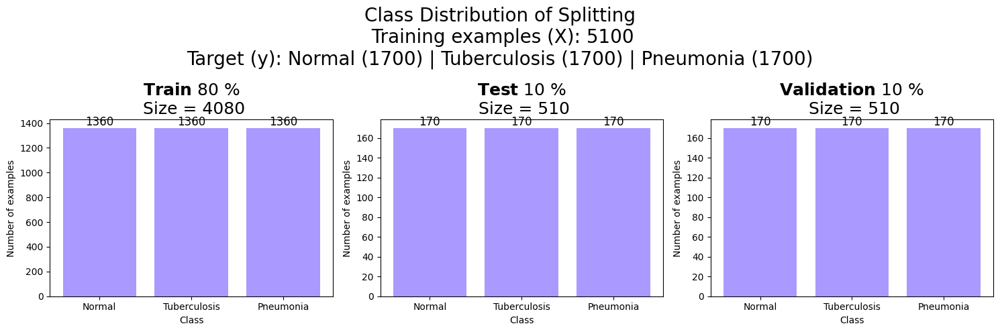

In [125]:
X_train, y_train, X_test, y_test, X_val, y_val = viz_class_distribution(X=X, 
                        y=y, 
                        title='Class Distribution of Splitting', 
                        classe_labels=['Normal', 'Tuberculosis', 'Pneumonia'], 
                        train_percent=0.8, 
                        val_percent=0.1, 
                        test_percent=0.1)

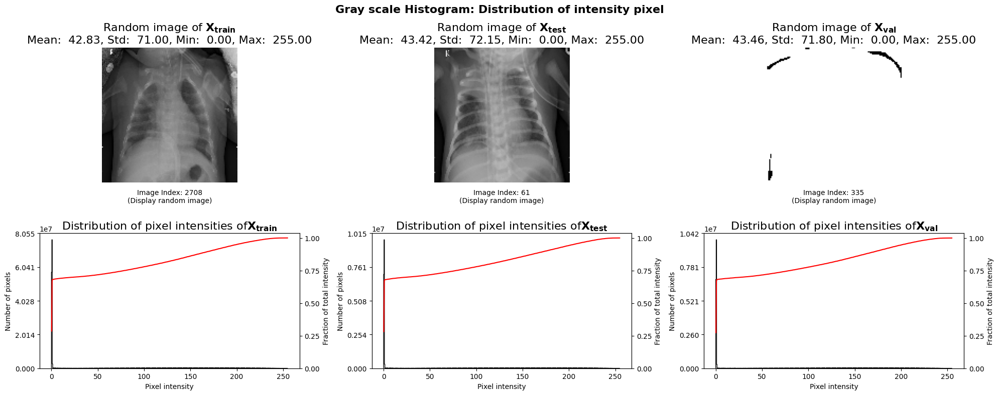

In [126]:
images = [X_train, X_test, X_val]
subsets = ['X_{train}', 'X_{test}', 'X_{val}']
# For visualization
plot_gray_scale_histogram(images=images, titles=subsets, bins=555)

**4. Modeling**

In [130]:
model_config = {
    # (height, width, channels)
    'input_shape': (128, 128,3),
    'unit_size_rate': 0.05,
    'l1_lambda': None,
    'l2_lambda': None,

    'conv_padding': 'same',
    'conv_kernel_size': (3, 3),
    'conv_stride': 1,

    'pool_padding': 'same',
    'pool_kernel_size': (2, 2),
    'pool_stride': 2,
    
    'dropout': 0,
    'pooling_type': 'max'
}

# Build model
model_1st = CNN(**model_config).build_model()
model_1st.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_18 (Conv2D)              │ (None, 128, 128, 1)    │            28 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 64, 64, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 64, 64, 3)      │            30 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 32, 32, 6)      │           168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 16, 16, 6)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 1536)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 6)              │         9,222 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 6)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 3)              │            21 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,469 (36.99 KB)

 Trainable params: 9,469 (36.99 KB)

 Non-trainable params: 0 (0.00 B)

In [131]:
# Train the model
history = densenet_model.train(X_train, y_train, X_val, y_val, epochs=10, batch_size=32, verbose=1)

# Make predictions
y_pred = densenet_model.predict(X_test)

import time

Epoch 1/10
  5/128 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.5408 - loss: 2.4156 

W0000 00:00:1713692852.455216     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - accuracy: 0.9321 - loss: 0.3101

W0000 00:00:1713692874.435578     116 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


128/128 ━━━━━━━━━━━━━━━━━━━━ 50s 213ms/step - accuracy: 0.9325 - loss: 0.3085 - val_accuracy: 1.0000 - val_loss: 0.0011
Epoch 2/10
  3/128 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.9809 - loss: 0.0441

W0000 00:00:1713692879.525958     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.9961 - loss: 0.0127 - val_accuracy: 1.0000 - val_loss: 0.0031
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 0.9988 - loss: 0.0026 - val_accuracy: 0.9980 - val_loss: 0.0033
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 0.9922 - loss: 0.0304 - val_accuracy: 1.0000 - val_loss: 4.7338e-04
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 0.9982 - loss: 0.0033 - val_accuracy: 0.9980 - val_loss: 0.0093
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.9998 - loss: 0.0011 - val_accuracy: 0.9941 - val_loss: 0.0232
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.9980 - val_loss: 0.0026
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 1.0000 - val_loss: 2.0773e-04
Epoch 9/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 1.0000 - loss: 2.3257e-05 - val_acc

W0000 00:00:1713692926.601749     116 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1713692936.297445     117 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [133]:
import time

start_time = time.time()
history = densenet_model.train(X_train, y_train, X_val, y_val, epochs=10, batch_size=32, verbose=1)
end_time = time.time()

total_training_time = end_time - start_time
print(f"Total training time: {total_training_time:.2f} seconds")

Epoch 1/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 1.0000 - loss: 1.0661e-06 - val_accuracy: 0.9980 - val_loss: 0.0017
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - accuracy: 1.0000 - loss: 8.9676e-07 - val_accuracy: 0.9980 - val_loss: 0.0016
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 1.0000 - loss: 3.0684e-06 - val_accuracy: 0.9980 - val_loss: 0.0031
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 1.0000 - loss: 2.8084e-06 - val_accuracy: 0.9980 - val_loss: 0.0029
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 1.0000 - loss: 2.5979e-07 - val_accuracy: 0.9980 - val_loss: 0.0022
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 1.0000 - loss: 2.8291e-06 - val_accuracy: 1.0000 - val_loss: 0.0010
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - accuracy: 1.0000 - loss: 2.6337e-06 - val_accuracy: 1.0000 - val_loss: 0.0012
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 1.00

In [134]:
optimizer = tf.keras.optimizers.Adam()
optimizer_config= optimizer.get_config()
optimizer_config

{'name': 'adam',
 'learning_rate': 0.0010000000474974513,
 'weight_decay': None,
 'clipnorm': None,
 'global_clipnorm': None,
 'clipvalue': None,
 'use_ema': False,
 'ema_momentum': 0.99,
 'ema_overwrite_frequency': None,
 'loss_scale_factor': None,
 'gradient_accumulation_steps': None,
 'beta_1': 0.9,
 'beta_2': 0.999,
 'epsilon': 1e-07,
 'amsgrad': False}

In [91]:
bvstart_time = time.time()
# verbose is progress bar; verbose = 1 display, verbose = don't display 
verbose = 1
# Compile the model
model_1st.compile(loss='binary_crossentropy',
                   optimizer=optimizer,
                   metrics=['accuracy'])

# Train the model
history = model_1st.fit(X_train, y_train, 
                             epochs=60,
                             batch_size=64,
                             validation_data=(X_val, y_val),
                             verbose=verbose)

end_time = time.time()
training_time = end_time - start_time
training_time

Epoch 1/60


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None,), output.shape=(None, 3)

In [ ]:
print(f'Training time in minutes: {training_time/60:.2f} minutes')

In [92]:
get_config = {
            'Optimizer parameters Configuration': {
                'optimizer_name': optimizer_config['name'],
                'learning_rate': optimizer_config['learning_rate'],
                'beta1': optimizer_config['beta_1'],
                'beta2': optimizer_config['beta_2'],
                'epsilon': optimizer_config['epsilon'],
            },
            'Hyperparameters Configuration': {
                'conv_padding': model_config['conv_padding'],
                'conv_kernel_size': model_config['conv_kernel_size'],
                'conv_stride': model_config['conv_stride'],
                'pool_padding': model_config['pool_padding'],
                'pool_kernel_size': model_config['pool_kernel_size'],
                'pool_stride': model_config['pool_stride'],
                'pooling_type': model_config['pooling_type'],
            },
            'Model Architecture Configuration': {
                'input_shape': model_config['input_shape'],
                'unit_size_rate': model_config['unit_size_rate']
            },
            'Model Training Configuration': {
                'batch_size': 20,
                'epoch': 64
            },
        }
get_config

{'Optimizer parameters Configuration': {'optimizer_name': 'adam',
  'learning_rate': 0.0010000000474974513,
  'beta1': 0.9,
  'beta2': 0.999,
  'epsilon': 1e-07},
 'Hyperparameters Configuration': {'conv_padding': 'same',
  'conv_kernel_size': (3, 3),
  'conv_stride': 1,
  'pool_padding': 'same',
  'pool_kernel_size': (2, 2),
  'pool_stride': 2,
  'pooling_type': 'max'},
 'Model Architecture Configuration': {'input_shape': (128, 128, 3),
  'unit_size_rate': 0.05},
 'Model Training Configuration': {'batch_size': 20, 'epoch': 64}}

In [93]:
def get_history(history,
                model,
                training_time:float, 
                ref_name:str, 
                title:str):

        best_epoch = np.argmax(history.history['val_accuracy'])
        best_train_epoch = np.argmax(history.history['accuracy'])

        # Create a 1x2 grid of subplots
        fig, axes = plt.subplots(1, 2, figsize=(24, 15))

        # Plot training and validation accuracy
        axes[0].plot(history.epoch, history.history['accuracy'],
                     label='Train Accuracy')
        axes[0].plot(history.epoch, history.history['val_accuracy'],
                     label='Validation Accuracy')
        axes[0].scatter(best_epoch, history.history['val_accuracy']
                        [best_epoch], color='r', label='Best Epoch (Validation)')
        axes[0].scatter(best_train_epoch, history.history['accuracy']
                        [best_train_epoch], color='g', label='Best Epoch (Train)')

        # Annotate the best validation accuracy point
        best_accuracy = history.history['val_accuracy'][best_epoch]
        random_offset_x = 10
        random_offset_y = np.random.randint(-30, 30)
        axes[0].annotate(f'{best_accuracy:.3f}',
                         xy=(best_epoch, best_accuracy),
                         xytext=(random_offset_x, random_offset_y),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Accuracy (%)')
        axes[0].set_title('Training and Validation Accuracy')
        axes[0].legend()

        # Annotate the best training accuracy point
        best_train_accuracy = history.history['accuracy'][best_train_epoch]
        random_offset_y = np.random.randint(-30, 30)
        axes[0].annotate(f'{best_train_accuracy:.3f}',
                         xy=(best_train_epoch, best_train_accuracy),
                         xytext=(random_offset_x, random_offset_y),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        # Plot training and validation loss
        axes[1].plot(history.epoch,
                    history.history['loss'], label='Train Loss')
        axes[1].plot(history.epoch, history.history['val_loss'],
                     label='Validation Loss')
        axes[1].scatter(best_epoch, history.history['val_loss']
                        [best_epoch], color='r', label='Best Epoch (Validation)')
        axes[1].scatter(best_train_epoch,history.history['loss']
                        [best_train_epoch], color='g', label='Best Epoch (Train)')
        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Loss')
        axes[1].set_title('Training and Validation Loss')
        axes[1].legend()

        # Annotate the best validation loss point
        best_loss = history.history['val_loss'][best_epoch]
        random_offset_y = np.random.randint(-30, 30)
        axes[1].annotate(f'{best_loss:.3f}',
                         xy=(best_epoch, best_loss),
                         xytext=(random_offset_x, random_offset_y),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        # Annotate the best training loss point
        best_train_loss = history.history['loss'][best_train_epoch]
        random_offset_y = np.random.randint(-30, 30)
        axes[1].annotate(f'{best_train_loss:.3f}',
                         xy=(best_train_epoch, best_train_loss),
                         xytext=(random_offset_x, random_offset_y),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        # Calculate best validation accuracy in percentage
        best_accuracy_percentage = round(best_accuracy * 100, 2)

        # String for performance, accuracy, and training time
        minutes = int(training_time // 60)
        seconds = int(training_time % 60)

        # model summary
        stringlist = []
        model.summary(print_fn=lambda x: stringlist.append(x))
        short_model_summary = "\n".join(stringlist)

        # Set the text for the parameters on the right side
        performance = r'$\bf{' + f'Ref. name: {ref_name}' + '}$' + f"\nBest Validation Accuracy: {best_accuracy_percentage}%" + \
            f"\nBest Train Accuracy: {history.history['accuracy'][best_train_epoch] * 100:.2f}%" + \
            f", Training Time: {minutes} minutes {seconds} seconds"
        fig.suptitle(r'$\bf{' + title + '}$' +
                     '\n' + performance, fontsize=18)

        fig.text(1.05, 1.00, r'$\bf{' + 'Config Parameters:' + '}$', fontsize=16,
                 color='black', ha='left', transform=plt.gcf().transFigure)

        y_coord = 0.98  # Initial y-coordinate

        # Set the line height between each parameter group and each parameter within a group
        line_height = 0.028

        for group, params in get_config.items():
            fig.text(1.05, y_coord, r'$\bf{' + f'{group}:' + '}$', fontsize=14,
                     color='black', ha='left', transform=plt.gcf().transFigure)
            y_coord -= line_height

            for key, value in params.items():
                fig.text(1.05, y_coord, f"{key}: {value}", fontsize=12,
                         color='black', ha='left', transform=plt.gcf().transFigure)
                y_coord -= line_height

        fig.text(1.05, 0.01, r'$\bf{' + f'Model Summary:' + '}$' + f'\n{short_model_summary}',
                 fontsize=10, color='black', ha='left', transform=plt.gcf().transFigure)

        plt.tight_layout()
        plt.show()

In [94]:
model_1st.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 128, 128, 1)    │            28 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 64, 64, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 64, 64, 3)      │            30 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 32, 32, 6)      │           168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 16, 16, 6)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 1536)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 6)              │         9,222 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 6)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 3)              │            21 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,469 (36.99 KB)

 Trainable params: 9,469 (36.99 KB)

 Non-trainable params: 0 (0.00 B)

In [100]:
# densenet_model.model.save('/kaggle/working/medical_trial_model45.h5')

densenet_model.model.save('/kaggle/working/densenetmodelv2equal.h5')

densenet_model.model.save('/kaggle/working/densenetmodelv2equalmodel.h5')

In [101]:
from tensorflow.keras.models import load_model
new_model = load_model('/kaggle/working/medical_trial_model4.h5')

new_model.summary()

new_model.get_weights()

new_model.optimizer

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 134, 134,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 64, 64,    │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 64, 64,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 64, 64,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 66, 66,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 32, 32,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 32, 32,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 32, 32,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 32, 32,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 32, 32,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 32, 32,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 32, 32,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 32, 32,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 32, 32,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 32, 32,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 32, 32,    │     12,288 │ conv2_block2_0_r

 Total params: 8,613,445 (32.86 MB)

 Trainable params: 1,575,939 (6.01 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

 Optimizer params: 2 (12.00 B)

In [103]:
from tensorflow.keras.models import load_model
densenet_model = load_model('/kaggle/working/densenetmodelv2equal.h5')

densenet_model.summary()
densenet_model.get_weights()

densenet_model.optimizer

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 134, 134,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 64, 64,    │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 64, 64,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 64, 64,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 66, 66,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 32, 32,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 32, 32,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 32, 32,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 32, 32,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 32, 32,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 32, 32,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 32, 32,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 32, 32,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 32, 32,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 32, 32,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 32, 32,    │     12,288 │ conv2_block2_0_r

 Total params: 8,613,445 (32.86 MB)

 Trainable params: 1,575,939 (6.01 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

 Optimizer params: 2 (12.00 B)

In [ ]:

save_path = '/kaggle/working/medical_trial_model4.h5'
# pneumonia_augmented, target_pneumonia_augmented = x_ray_image_augmentation(
#     images=pneumonia, 
#     targets=target_pneumonia, 
#     sample_count=3,
#     save_path=save_path
# )

from IPython.display import FileLink
FileLink(save_path)

In [ ]:
title = 'Experiment 1: Build 1st CNNs model'
get_history(history=history,
            model=model_1st,
            training_time=training_time, 
            title=title, 
            ref_name='Original Dataset')

In [104]:
import json
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, accuracy_score, roc_curve, roc_auc_score, f1_score

**Modified for multiclass classification**

In [105]:
import pandas as pd
import json
from sklearn.metrics import roc_curve, roc_auc_score, classification_report, confusion_matrix

def evaluate(estimator_name, estimator, X, y_actual, subset_name, training_time, threshold=None):
    # Model Prediction/Y hat
    y_pred = estimator.predict(X)
    
    # Handling Output Layer of Activation='softmax' for multiclass
    threshold = threshold if threshold else 0.5
    y_pred_binary = (y_pred > threshold).astype(int)

    # Calculate ROC curve and AUC score (not applicable for multiclass)
    fpr, tpr, thresholds = None, None, None
    auc_score = None
    
    # Classification Report
    report = classification_report(y_actual, y_pred_binary, output_dict=True)
    report_dict = json.loads(json.dumps(report))

    # Extract precision, recall, and f1-score for each class from report_dict
    precision = report_dict['weighted avg']['precision']
    recall = report_dict['weighted avg']['recall']
    accuracy = report_dict['accuracy']
    f1 = report_dict['weighted avg']['f1-score']

    # Confusion Matrix
    cm = confusion_matrix(y_actual, y_pred_binary)
    
    # If multiclass, the confusion matrix is a 2D array
    # For simplicity, we will only compute TP, FP, FN, TN for the first class and
    # consider the rest as other classes
    TP = cm[0, 0]
    FP = cm[0, 1:].sum()
    FN = cm[1:, 0].sum()
    TN = cm[1:, 1:].sum()

    # Format training time
    minutes = int(training_time // 60)
    seconds = int(training_time % 60)
    training_time_ = "{} minutes {} seconds".format(minutes, seconds)

    performance_info = {
        'Model': estimator_name,
        'Subset': subset_name,
        'Training time': training_time_,
        'Training in seconds': training_time,
        'TP': TP,
        'FP': FP,
        'FN': FN,
        'TN': TN,
        'Precision': precision,
        'Recall': recall,
        'F1': f1,
        'Accuracy': accuracy,
    }
    
    return pd.DataFrame([performance_info])

# Example usage:
# performance_df = evaluate('RandomForest', rf_model, X_test, y_test, 'Test', 120, threshold=0.5)


In [136]:
import pandas as pd
import json
from sklearn.metrics import roc_curve, roc_auc_score, classification_report, confusion_matrix

def evaluate(estimator_name, estimator, X, y_actual, subset_name, training_time, num_classes=3):
    # Model Prediction/Y hat
    y_pred = estimator.predict(X)

    # Classification Report
    report = classification_report(y_actual, y_pred, output_dict=True)
    report_dict = json.loads(json.dumps(report))

    # Extract precision, recall, and f1-score for each class from report_dict
    precision = report_dict['macro avg']['precision']
    recall = report_dict['macro avg']['recall']
    accuracy = report_dict['accuracy']
    f1 = report_dict['macro avg']['f1-score']

    # Confusion Matrix
    cm = confusion_matrix(y_actual, y_pred)

    # Compute TP, FP, FN, TN for each class
    tp = [cm[i, i] for i in range(num_classes)]
    fn = [cm[i, :].sum() - cm[i, i] for i in range(num_classes)]
    fp = [cm[:, i].sum() - cm[i, i] for i in range(num_classes)]
    tn = [cm.sum() - tp[i] - fn[i] - fp[i] for i in range(num_classes)]

    # Format training time
    minutes = int(training_time // 60)
    seconds = int(training_time % 60)
    training_time_ = "{} minutes {} seconds".format(minutes, seconds)

    performance_info = {
        'Model': estimator_name,
        'Subset': subset_name,
        'Training time': training_time_,
        'Training in seconds': training_time,
        'Precision': precision,
        'Recall': recall,
        'F1': f1,
        'Accuracy': accuracy,
    }

    for i in range(num_classes):
        performance_info[f'TP_{i}'] = tp[i]
        performance_info[f'FP_{i}'] = fp[i]
        performance_info[f'FN_{i}'] = fn[i]
        performance_info[f'TN_{i}'] = tn[i]

    return pd.DataFrame([performance_info])

# Example usage:
# performance_df = evaluate('CNN', loaded_model, X_test, y_test, 'Test', 120, num_classes=3)

In [138]:
import pandas as pd
import json
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix

def evaluate_with_proba(estimator_name, estimator, X, y_actual, subset_name, training_time, num_classes=3):
    # Get predicted probabilities
    y_prob = estimator.predict_proba(X)
    
    # Convert probabilities to class labels
    y_pred = np.argmax(y_prob, axis=1)

    # Classification Report
    report = classification_report(y_actual, y_pred, output_dict=True)
    report_dict = json.loads(json.dumps(report))

    # Extract precision, recall, and f1-score for each class from report_dict
    precision = report_dict['macro avg']['precision']
    recall = report_dict['macro avg']['recall']
    accuracy = report_dict['accuracy']
    f1 = report_dict['macro avg']['f1-score']

    # Confusion Matrix
    cm = confusion_matrix(y_actual, y_pred)

    # Compute TP, FP, FN, TN for each class
    tp = [cm[i, i] for i in range(num_classes)]
    fn = [cm[i, :].sum() - cm[i, i] for i in range(num_classes)]
    fp = [cm[:, i].sum() - cm[i, i] for i in range(num_classes)]
    tn = [cm.sum() - tp[i] - fn[i] - fp[i] for i in range(num_classes)]

    # Format training time
    minutes = int(training_time // 60)
    seconds = int(training_time % 60)
    training_time_ = "{} minutes {} seconds".format(minutes, seconds)

    performance_info = {
        'Model': estimator_name,
        'Subset': subset_name,
        'Training time': training_time_,
        'Training in seconds': training_time,
        'Precision': precision,
        'Recall': recall,
        'F1': f1,
        'Accuracy': accuracy,
    }

    for i in range(num_classes):
        performance_info[f'TP_{i}'] = tp[i]
        performance_info[f'FP_{i}'] = fp[i]
        performance_info[f'FN_{i}'] = fn[i]
        performance_info[f'TN_{i}'] = tn[i]

    return pd.DataFrame([performance_info])


**TRAINING SET PERFORMANCE**

In [139]:
# evaluate(estimator_name='CNN', 
#          estimator=model_1st, 
#          X=X_train, 
#          y_actual=y_train, 
#          subset_name='Training', 
#          training_time=5
#          )

evaluate(estimator_name='DenseNet121Model', 
         estimator=densenet_model, 
         X=X_train, 
         y_actual=y_train, 
         subset_name='Training', 
         training_time=total_training_time
         )

ValueError: Classification metrics can't handle a mix of multiclass and continuous-multioutput targets

**Adapted for multiclass classification**

In [153]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score, precision_recall_curve, average_precision_score

def plot_confusion_matrix(y_actual, y_pred, subset_name):
    # Convert predicted probabilities to predicted classes
    y_pred_classes = y_pred.argmax(axis=1)
    
    # Calculate confusion matrix
    cm = confusion_matrix(y_actual, y_pred_classes)
    
    # Extract TP, TN, FP, FN for each class
    num_classes = len(cm)
    tp = [cm[i, i] for i in range(num_classes)]
    fn = [cm[i, :].sum() - cm[i, i] for i in range(num_classes)]
    fp = [cm[:, i].sum() - cm[i, i] for i in range(num_classes)]
    tn = [cm.sum() - tp[i] - fn[i] - fp[i] for i in range(num_classes)]
    
    # Calculate accuracy
    accuracy = np.trace(cm) / np.sum(cm)
    
    # Calculate macro precision, recall, and f1-score
    macro_precision = np.mean([tp[i] / (tp[i] + fp[i]) for i in range(num_classes) if tp[i] + fp[i] > 0])
    macro_recall = np.mean([tp[i] / (tp[i] + fn[i]) for i in range(num_classes) if tp[i] + fn[i] > 0])
    
    # Calculate micro precision, recall, and f1-score
    micro_precision = np.sum(tp) / (np.sum(tp) + np.sum(fp))
    micro_recall = np.sum(tp) / (np.sum(tp) + np.sum(fn))
    
    # Plot confusion matrix
    plt.figure(figsize=(18, 9))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    
    # Create the title for the plot
    title = f'Confusion Matrix - {subset_name}\n'
    title += f'Accuracy: {accuracy:.4f}\n'
    title += f'Macro Precision: {macro_precision:.4f}, Macro Recall: {macro_recall:.4f}\n'
    title += f'Micro Precision: {micro_precision:.4f}, Micro Recall: {micro_recall:.4f}\n'
    for i in range(num_classes):
        title += f'Class {i} - TP: {tp[i]}, TN: {tn[i]}, FP: {fp[i]}, FN: {fn[i]}\n'
    plt.title(title, loc='center', wrap=True)
    
    plt.show()
    
    # Plot ROC curve and calculate AUC score
    plt.figure(figsize=(10, 8))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_actual == i, y_pred[:, i])
        auc_score = roc_auc_score(y_actual == i, y_pred[:, i])
        plt.plot(fpr, tpr, label=f'Class {i} (AUC = {auc_score:.2f})')
    
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.show()


In [156]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score

def plot_confusion_matrix(y_actual, y_pred, subset_name):
    # Convert predicted probabilities to predicted classes
    y_pred_classes = y_pred.argmax(axis=1)
    
    # Calculate confusion matrix
    cm = confusion_matrix(y_actual, y_pred_classes)
    
    # Extract TP, TN, FP, FN for each class
    num_classes = len(cm)
    tp = [cm[i, i] for i in range(num_classes)]
    fn = [cm[i, :].sum() - cm[i, i] for i in range(num_classes)]
    fp = [cm[:, i].sum() - cm[i, i] for i in range(num_classes)]
    tn = [cm.sum() - tp[i] - fn[i] - fp[i] for i in range(num_classes)]
    
    # Calculate accuracy
    accuracy = np.trace(cm) / np.sum(cm)
    
    # Plot confusion matrix
    plt.figure(figsize=(18, 9))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    
    # Create the title for the plot
    title = f'Confusion Matrix - {subset_name}\n'
    title += f'Accuracy: {accuracy:.4f}\n'
    for i in range(num_classes):
        title += f'Class {i} - TP: {tp[i]}, TN: {tn[i]}, FP: {fp[i]}, FN: {fn[i]}\n'
    plt.title(title, loc='center', wrap=True)
    
    plt.show()
    
    # Plot ROC curve and calculate AUC score
    plt.figure(figsize=(10, 8))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_actual == i, y_pred[:, i])
        auc_score = roc_auc_score(y_actual == i, y_pred[:, i])
        plt.plot(fpr, tpr, label=f'Class {i} (AUC = {auc_score:.2f})')
    
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.show()
    
    # Calculate and output precision, recall, and f1-score
    macro_precision = np.mean([tp[i] / (tp[i] + fp[i]) for i in range(num_classes) if tp[i] + fp[i] > 0])
    macro_recall = np.mean([tp[i] / (tp[i] + fn[i]) for i in range(num_classes) if tp[i] + fn[i] > 0])
    macro_f1 = 2 * (macro_precision * macro_recall) / (macro_precision + macro_recall) if (macro_precision + macro_recall) > 0 else 0
    
    micro_precision = np.sum(tp) / (np.sum(tp) + np.sum(fp))
    micro_recall = np.sum(tp) / (np.sum(tp) + np.sum(fn))
    micro_f1 = 2 * (micro_precision * micro_recall) / (micro_precision + micro_recall) if (micro_precision + micro_recall) > 0 else 0
    
    print(f'Macro Precision: {macro_precision:.4f}')
    print(f'Macro Recall: {macro_recall:.4f}')
    print(f'Macro F1-score: {macro_f1:.4f}')
    print(f'Micro Precision: {micro_precision:.4f}')
    print(f'Micro Recall: {micro_recall:.4f}')
    print(f'Micro F1-score: {micro_f1:.4f}')


In [148]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# from sklearn.metrics import confusion_matrix

# def plot_confusion_matrix(y_actual, y_pred, subset_name):
#     # Convert predicted probabilities to predicted classes
#     y_pred_classes = y_pred.argmax(axis=1)
    
#     # Calculate confusion matrix
#     cm = confusion_matrix(y_actual, y_pred_classes)
    
#     # Extract TP, TN, FP, FN for each class
#     num_classes = len(cm)
#     tp = [cm[i, i] for i in range(num_classes)]
#     fn = [cm[i, :].sum() - cm[i, i] for i in range(num_classes)]
#     fp = [cm[:, i].sum() - cm[i, i] for i in range(num_classes)]
#     tn = [cm.sum() - tp[i] - fn[i] - fp[i] for i in range(num_classes)]
    
#     plt.figure(figsize=(18, 9))
#     sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
    
#     plt.xlabel('Predicted')
#     plt.ylabel('Actual')
    
#     # Create the title for the plot
#     title = f'Confusion Matrix - {subset_name}\n'
#     for i in range(num_classes):
#         title += f'Class {i} - TP: {tp[i]}, TN: {tn[i]}, FP: {fp[i]}, FN: {fn[i]}\n'
#     plt.title(title, loc='center', wrap=True)
    
#     plt.show()

# # Example usage:
# # plot_confusion_matrix(y_test, y_pred, 'Test')


In [159]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score

def plot_confusion_matrix(y_actual, y_pred, subset_name):
    # Convert predicted probabilities to predicted classes
    y_pred_classes = y_pred.argmax(axis=1)
    
    # Calculate confusion matrix
    cm = confusion_matrix(y_actual, y_pred_classes)
    
    # Extract TP, TN, FP, FN for each class
    num_classes = len(cm)
    tp = [cm[i, i] for i in range(num_classes)]
    fn = [cm[i, :].sum() - cm[i, i] for i in range(num_classes)]
    fp = [cm[:, i].sum() - cm[i, i] for i in range(num_classes)]
    tn = [cm.sum() - tp[i] - fn[i] - fp[i] for i in range(num_classes)]
    
    # Calculate evaluation metrics
    accuracy = np.trace(cm) / np.sum(cm)
    
    macro_precision = np.mean([tp[i] / (tp[i] + fp[i]) for i in range(num_classes) if tp[i] + fp[i] > 0])
    macro_recall = np.mean([tp[i] / (tp[i] + fn[i]) for i in range(num_classes) if tp[i] + fn[i] > 0])
    macro_f1 = 2 * (macro_precision * macro_recall) / (macro_precision + macro_recall) if (macro_precision + macro_recall) > 0 else 0
    
    micro_precision = np.sum(tp) / (np.sum(tp) + np.sum(fp))
    micro_recall = np.sum(tp) / (np.sum(tp) + np.sum(fn))
    micro_f1 = 2 * (micro_precision * micro_recall) / (micro_precision + micro_recall) if (micro_precision + micro_recall) > 0 else 0
    
    # Create a DataFrame to display evaluation metrics
    metrics_data = {
        'Metric': ['Accuracy', 'Macro Precision', 'Macro Recall', 'Macro F1-score', 'Micro Precision', 'Micro Recall', 'Micro F1-score'],
        'Value': [accuracy, macro_precision, macro_recall, macro_f1, micro_precision, micro_recall, micro_f1]
    }
    
    metrics_df = pd.DataFrame(metrics_data)
    
    # Plot confusion matrix
    plt.figure(figsize=(18, 9))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    
    # Create the title for the plot
    title = f'Confusion Matrix - {subset_name}'
    plt.title(title, loc='center', wrap=True)
    
    plt.show()
    
    # Plot ROC curve and calculate AUC score
    plt.figure(figsize=(10, 8))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_actual == i, y_pred[:, i])
        auc_score = roc_auc_score(y_actual == i, y_pred[:, i])
        plt.plot(fpr, tpr, label=f'Class {i} (AUC = {auc_score:.2f})')
    
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.show()
    
    # Display evaluation metrics
    print("Evaluation Metrics:")
    print(metrics_df.to_string(index=False))


In [164]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score

def plot_confusion_matrix(y_actual, y_pred, subset_name):
    # Convert predicted probabilities to predicted classes
    y_pred_classes = y_pred.argmax(axis=1)
    
    # Calculate confusion matrix
    cm = confusion_matrix(y_actual, y_pred_classes)
    
    # Extract TP, TN, FP, FN for each class
    num_classes = len(cm)
    tp = [cm[i, i] for i in range(num_classes)]
    fn = [cm[i, :].sum() - cm[i, i] for i in range(num_classes)]
    fp = [cm[:, i].sum() - cm[i, i] for i in range(num_classes)]
    tn = [cm.sum() - tp[i] - fn[i] - fp[i] for i in range(num_classes)]
    
    # Calculate evaluation metrics
    accuracy = np.trace(cm) / np.sum(cm)
    
    precision = np.mean([tp[i] / (tp[i] + fp[i]) for i in range(num_classes) if tp[i] + fp[i] > 0])
    recall = np.mean([tp[i] / (tp[i] + fn[i]) for i in range(num_classes) if tp[i] + fn[i] > 0])
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    
    # Create a DataFrame to display evaluation metrics
    metrics_data = {
        'Metric': ['Accuracy', 'Precision', 'Recall', 'F1-score'],
        'Value': [accuracy, precision, recall, f1_score]
    }
    
    metrics_df = pd.DataFrame(metrics_data)
    
    # Plot confusion matrix
    plt.figure(figsize=(18, 9))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    
    # Create the title for the plot
    title = f'Confusion Matrix - {subset_name}'
    plt.title(title, loc='center', wrap=True)
    
    plt.show()
    
    # Plot ROC curve and calculate AUC score
    plt.figure(figsize=(10, 8))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_actual == i, y_pred[:, i])
        auc_score = roc_auc_score(y_actual == i, y_pred[:, i])
        plt.plot(fpr, tpr, label=f'Class {i} (AUC = {auc_score:.2f})')
    
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.show()
    
    # Display evaluation metrics
    print("Evaluation Metrics:")
    print(metrics_df.to_string(index=False))


In [165]:
y_pred_test = densenet_model.predict(X_test)

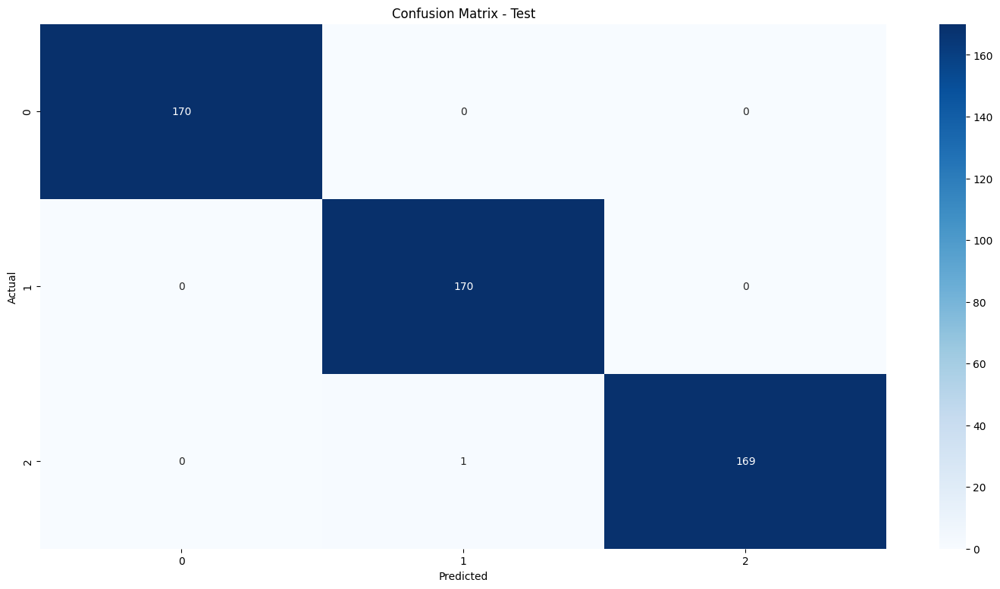

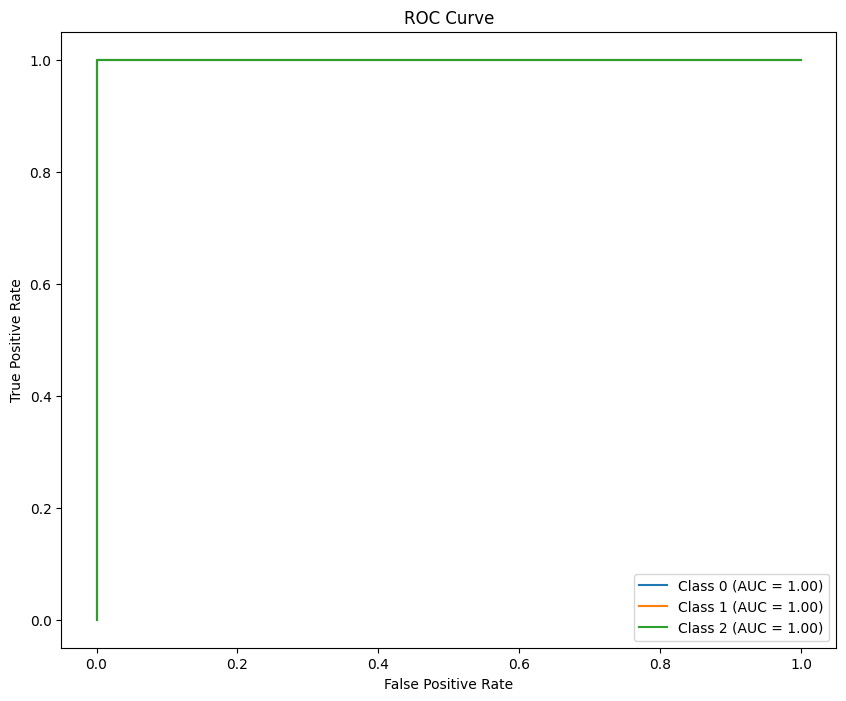

Evaluation Metrics:
   Metric    Value
 Accuracy 0.998039
Precision 0.998051
   Recall 0.998039
 F1-score 0.998045


In [166]:
plot_confusion_matrix(y_actual=y_test, 
                      y_pred=y_pred_test, 
                      subset_name='Test')

In [168]:
densenet_model_with_metrics  = densenet_model.model.save('/kaggle/working/densenet_with_metrics.h5')

In [163]:
best_model  = model_1st.save('/kaggle/working/best_model.h5')



In [ ]:
print("hello world")

In [ ]:
new_model


In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model

# loaded_model = load_model('/kaggle/working/best_model.h5')

loaded_model = load_model('/kaggle/working/medical_trial_model4.h5')

class_names = {
    0: 'Normal',
    1: 'Tuberculosis',
    2: 'Pneumonia'
}

# image = cv2.imread('/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Tuberculosis/Tuberculosis-121.png')
image = cv2.imread('/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Normal/Normal-100.png')

image_resized = cv2.resize(image, (128, 128))

image_rgb = cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB)

image_normalized = image_rgb / 255.0

image_expanded = np.expand_dims(image_normalized, axis=0)

# prediction = loaded_model.predict(image_expanded)

# predicted_class_prob = prediction[0]  # Now it will have 3 probabilities

# predicted_class = np.argmax(predicted_class_prob)  # Get the index of the highest probability

# predicted_class_name = class_names[predicted_class]

# print("Prediction Probabilities:", prediction)
# print("Predicted Class:", predicted_class_name)


In [ ]:
prediction = loaded_model.predict(image_expanded)
predicted_class_probs = prediction[0]  # Get the array of probabilities for this example

# Print probabilities for each class
for i, class_prob in enumerate(predicted_class_probs):
    class_name = class_names[i]
    print(f"{class_name}: {class_prob * 100:.2f}%")

# Get the index of the highest probability
predicted_class = np.argmax(predicted_class_probs)
predicted_class_name = class_names[predicted_class]

print("\nPredicted Class:", predicted_class_name)

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model

# Load the pre-trained model
# loaded_model = load_model('/path/to/your/model.h5')
loaded_model = load_model('/kaggle/working/medical_trial_model4.h5')

class_names = {
    0: 'Normal',
    1: 'Tuberculosis',
    2: 'Pneumonia'
}

def preprocess_image(image_path):
    image = cv2.imread(image_path)
    image_resized = cv2.resize(image, (128, 128))
    image_rgb = cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB)
    image_normalized = image_rgb / 255.0
    image_expanded = np.expand_dims(image_normalized, axis=0)
    return image_expanded

def get_prediction(model, image_path):
    preprocessed_image = preprocess_image(image_path)
    prediction = model.predict(preprocessed_image)
    predicted_class_probs = prediction[0]

    # Print probabilities for each class
    for class_idx, class_prob in enumerate(predicted_class_probs):
        class_name = class_names[class_idx]
        print(f"{class_name}: {class_prob * 100:.2f}%")

    # Get the index of the highest probability
    predicted_class = np.argmax(predicted_class_probs)
    predicted_class_name = class_names[predicted_class]

    print("\nPredicted Class:", predicted_class_name)

# Example usage
# image_path = '/path/to/your/image.png'
image_path = cv2.imread('/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Tuberculosis/Tuberculosis-121.png')

get_prediction(loaded_model, image_path)

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model

# Load the pre-trained model
# loaded_model = load_model('/path/to/your/model.h5')
loaded_model = load_model('/kaggle/working/densenetmodelv2.h5')

class_names = {
    0: 'Normal',
    1: 'Tuberculosis',
    2: 'Pneumonia'
}

def preprocess_image(image_path):
    image = cv2.imread(image_path)
    image_resized = cv2.resize(image, (128, 128))
    image_rgb = cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB)
    image_normalized = image_rgb / 255.0
    image_expanded = np.expand_dims(image_normalized, axis=0)
    return image_expanded

def get_prediction(model, image_path):
    preprocessed_image = preprocess_image(image_path)
    prediction = model.predict(preprocessed_image)
    predicted_class_probs = prediction[0]

    # Print probabilities for each class
    for class_idx, class_prob in enumerate(predicted_class_probs):
        class_name = class_names[class_idx]
        print(f"{class_name}: {class_prob * 100:.2f}%")

    # Get the index of the highest probability
    predicted_class = np.argmax(predicted_class_probs)
    predicted_class_name = class_names[predicted_class]

    print("\nPredicted Class:", predicted_class_name)

# Example usage
# image_path = '/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Normal/Normal-491.png'
image_path = '/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Normal/Normal-2303.png'
# image_path = '/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/train/PNEUMONIA/person66_bacteria_323.jpeg'
# image_path = '/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/train/PNEUMONIA/person1657_bacteria_4398.jpeg'
# image_path = '/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Tuberculosis/Tuberculosis-121.png'
get_prediction(loaded_model, image_path)

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
import tensorflow as tf

# Load the pre-trained model
# loaded_model = load_model('/path/to/your/model.h5')
loaded_model = load_model('/kaggle/working/densenetmodelv2.h5')

class_names = {
    0: 'Normal',
    1: 'Tuberculosis',
    2: 'Pneumonia'
}

def preprocess_image(image_path):
    image = cv2.imread(image_path)
    image_resized = cv2.resize(image, (128, 128))
    image_rgb = cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB)
    image_normalized = image_rgb / 255.0
    image_expanded = np.expand_dims(image_normalized, axis=0)
    return image_expanded

def get_prediction(model, image_path):
    preprocessed_image = preprocess_image(image_path)
    prediction = model.predict(preprocessed_image)
    softmax_probabilities = tf.nn.softmax(prediction[0]).numpy()

    # Print probabilities for each class
    for class_idx, class_prob in enumerate(softmax_probabilities):
        class_name = class_names[class_idx]
        print(f"{class_name}: {class_prob * 100:.2f}%")

    # Get the index of the highest probability
    predicted_class = np.argmax(softmax_probabilities)
    predicted_class_name = class_names[predicted_class]

    print("\nPredicted Class:", predicted_class_name)

# Example usage
# image_path = '/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Normal/Normal-491.png'
image_path = '/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Normal/Normal-2303.png'
# image_path = '/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/train/PNEUMONIA/person66_bacteria_323.jpeg'
# image_path = '/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/train/PNEUMONIA/person1657_bacteria_4398.jpeg'
# image_path = '/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Tuberculosis/Tuberculosis-121.png'

get_prediction(loaded_model, image_path)

In [169]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
import tensorflow as tf

# Load the pre-trained model
# loaded_model = load_model('/path/to/your/model.h5')
loaded_model = load_model('/kaggle/working/densenet_with_metrics.h5')

class_names = {
    0: 'Normal',
    1: 'Tuberculosis',
    2: 'Pneumonia'
}

def preprocess_image(image_path):
    image = cv2.imread(image_path)
    image_resized = cv2.resize(image, (128, 128))
    image_rgb = cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB)
    image_normalized = image_rgb / 255.0
    image_expanded = np.expand_dims(image_normalized, axis=0)
    return image_expanded

def get_prediction(model, image_path):
    preprocessed_image = preprocess_image(image_path)
    prediction = model.predict(preprocessed_image)
    softmax_probabilities = tf.nn.softmax(prediction[0]).numpy()

    # Print probabilities for each class
    for class_idx, class_prob in enumerate(softmax_probabilities):
        class_name = class_names[class_idx]
        print(f"{class_name}: {class_prob:.6f}")  # Print probabilities with 6 decimal places

    # Get the index of the highest probability
    predicted_class = np.argmax(softmax_probabilities)
    predicted_class_name = class_names[predicted_class]

    print("\nPredicted Class:", predicted_class_name)

# Example usage
image_path = '/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Normal/Normal-491.png'
image_path = '/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Normal/Normal-2303.png'
# image_path = '/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/train/PNEUMONIA/person66_bacteria_323.jpeg'
# image_path = '/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/train/PNEUMONIA/person1000_bacteria_2931.jpeg'
# image_path = '/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Tuberculosis/Tuberculosis-121.png'

get_prediction(loaded_model, image_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
Normal: 0.211942
Tuberculosis: 0.576117
Pneumonia: 0.211942

Predicted Class: Tuberculosis
